Nanos Georgios  <br>
Data Science and Machine Learning <br> 
email: nanosgiwrgos1997@gmail.com

Α. **Introduction**


In [ ]:
!pip install pyspark
from pyspark.sql import SparkSession
import datetime as dt
from pyspark.sql import functions as F
from pyspark import SparkFiles
from pyspark.sql.types import IntegerType, StringType, DoubleType
from pyspark.sql.functions import *
import math
import matplotlib.pyplot as plt
import seaborn as sns
from pyspark.sql.functions import *
from pyspark.sql.types import StringType, StructType, StructField, IntegerType, DoubleType
import warnings
warnings.filterwarnings("ignore")

In [ ]:
url = 'https://covid.ourworldindata.org/data/owid-covid-data.csv'

In [ ]:
spark = SparkSession.builder\
        .master("local")\
        .appName("Colab")\
        .config('spark.ui.port', '4050')\
        .getOrCreate()

In [ ]:
spark.sparkContext.addFile(url)

df = spark.read.csv("file://" + SparkFiles.get("owid-covid-data.csv"), header=True, inferSchema= True)
df_init = df

In [ ]:
df.show(5)

+--------+---------+-----------+----------+-----------+---------+------------------+------------+----------+-------------------+-----------------------+---------------------+------------------------------+------------------------+----------------------+-------------------------------+-----------------+------------+------------------------+-------------+-------------------------+---------------------+---------------------------------+----------------------+----------------------------------+-----------+---------+------------------------+----------------------+------------------+-------------------------------+-------------+--------------+-----------+------------------+-----------------+-----------------------+--------------+----------------+-------------------------+------------------------------+-----------------------------+-----------------------------------+--------------------------+-------------------------------------+------------------------------+-------------------------------

In [ ]:
#some descriptions of the dataset
df.describe().show()

+-------+--------+-------------+-----------+----------+--------------------+------------------+------------------+------------------+------------------+-------------------+-----------------------+---------------------+------------------------------+------------------------+----------------------+-------------------------------+-------------------+-----------------+------------------------+------------------+-------------------------+---------------------+---------------------------------+----------------------+----------------------------------+--------------------+------------------+------------------------+----------------------+------------------+-------------------------------+-------------------+------------------+-------------+-------------------+-------------------+-----------------------+--------------------+------------------+-------------------------+------------------------------+-----------------------------+-----------------------------------+--------------------------+---

**Β. Question 1: Overview of the Data **

1. 
What is the number of samples & characteristics of the data set?

In [ ]:
print("Total number of samples is: ", df.count())
print("Total number of features is: ", len(df.schema))

Total number of samples is:  167936
Total number of features is:  67


2. What are the types of data set features?

In [ ]:
print("The different types of the features of our dataset are: ")
df.printSchema()

The different types of the features of our dataset are: 
root
 |-- iso_code: string (nullable = true)
 |-- continent: string (nullable = true)
 |-- location: string (nullable = true)
 |-- date: string (nullable = true)
 |-- total_cases: double (nullable = true)
 |-- new_cases: double (nullable = true)
 |-- new_cases_smoothed: double (nullable = true)
 |-- total_deaths: double (nullable = true)
 |-- new_deaths: double (nullable = true)
 |-- new_deaths_smoothed: double (nullable = true)
 |-- total_cases_per_million: double (nullable = true)
 |-- new_cases_per_million: double (nullable = true)
 |-- new_cases_smoothed_per_million: double (nullable = true)
 |-- total_deaths_per_million: double (nullable = true)
 |-- new_deaths_per_million: double (nullable = true)
 |-- new_deaths_smoothed_per_million: double (nullable = true)
 |-- reproduction_rate: double (nullable = true)
 |-- icu_patients: double (nullable = true)
 |-- icu_patients_per_million: double (nullable = true)
 |-- hosp_patients

3. 
Are there any unordered features and what are they?



In the location column the countries are ordered alphabetically, the dates are also ordered, the rest of the information about covid is not ordered

4. 
Are there any missing prices? Sort and display, in descending order, the features that are missing values

In [ ]:
d = df.select([F.count(F.when(F.isnull(c), c)).alias(c) for c in df.columns])

In [ ]:
d.show()

+--------+---------+--------+----+-----------+---------+------------------+------------+----------+-------------------+-----------------------+---------------------+------------------------------+------------------------+----------------------+-------------------------------+-----------------+------------+------------------------+-------------+-------------------------+---------------------+---------------------------------+----------------------+----------------------------------+-----------+---------+------------------------+----------------------+------------------+-------------------------------+-------------+--------------+-----------+------------------+-----------------+-----------------------+--------------+----------------+-------------------------+------------------------------+-----------------------------+-----------------------------------+--------------------------+-------------------------------------+------------------------------+----------------------------------------

In [ ]:
lst = []
lst_col = d.columns
for i in range(len(d.schema)):
  lst.append(d.rdd.map(lambda x : x[i]).collect())

lst, lst_col = zip(*sorted(zip(lst, lst_col), reverse=True))
print('The columns with the most null values in descending order are: ')
print(lst)
print(lst_col)

The columns with the most null values in descending order are: 
([162419], [162419], [162189], [162189], [162189], [162189], [156892], [156892], [149912], [149912], [144227], [144227], [143064], [143064], [130218], [127260], [127260], [124535], [124535], [122301], [122301], [99900], [99900], [98702], [97813], [97813], [88464], [87867], [83360], [83360], [82474], [82474], [82018], [82018], [80059], [75846], [62333], [60864], [43082], [40773], [36712], [30360], [30283], [29835], [29521], [28775], [28095], [23785], [23039], [22594], [21703], [21682], [20951], [20930], [18580], [11163], [10047], [5971], [5212], [3988], [3812], [3223], [3047], [1082], [0], [0], [0])
('weekly_icu_admissions_per_million', 'weekly_icu_admissions', 'excess_mortality_cumulative_per_million', 'excess_mortality_cumulative_absolute', 'excess_mortality_cumulative', 'excess_mortality', 'weekly_hosp_admissions_per_million', 'weekly_hosp_admissions', 'total_boosters_per_hundred', 'total_boosters', 'icu_patients_per_mil

**
Question 2: Pre-processing the data set**

Following the first question, indicate if you noticed the following phenomena and in case of a positive answer, how you dealt with them

1. Absent values
2. The outliers 
3. 
The duplicate registrations (if any)

1.

In [ ]:
df.filter("continent is NULL").show()

+--------+---------+--------+----------+-----------+---------+------------------+------------+----------+-------------------+-----------------------+---------------------+------------------------------+------------------------+----------------------+-------------------------------+-----------------+------------+------------------------+-------------+-------------------------+---------------------+---------------------------------+----------------------+----------------------------------+-----------+---------+------------------------+----------------------+------------------+-------------------------------+-------------+--------------+-----------+------------------+-----------------+-----------------------+--------------+----------------+-------------------------+------------------------------+-----------------------------+-----------------------------------+--------------------------+-------------------------------------+------------------------------+----------------------------------

With a first look it seems that whenever the column continent is null the column location contains the continent. We check this below just to be sure. 

In [ ]:
df.filter(df.continent.isNull() & df.location.isNull() & df.tests_units.isNull() ).show()

+--------+---------+--------+----+-----------+---------+------------------+------------+----------+-------------------+-----------------------+---------------------+------------------------------+------------------------+----------------------+-------------------------------+-----------------+------------+------------------------+-------------+-------------------------+---------------------+---------------------------------+----------------------+----------------------------------+-----------+---------+------------------------+----------------------+------------------+-------------------------------+-------------+--------------+-----------+------------------+-----------------+-----------------------+--------------+----------------+-------------------------+------------------------------+-----------------------------+-----------------------------------+--------------------------+-------------------------------------+------------------------------+----------------------------------------

It seems that continent and location are never null together, so we will not change anything whenever there is a null value in those two columns. Since our dataset seems to count data about cases, deaths and tests for Covid19 we can replace the null values with zeros, without having any problem. 

In [ ]:
df = df.na.fill(0)
df_init = df_init.na.fill(0)

In [ ]:
df.select([F.count(F.when(F.isnull(c), c)).alias(c) for c in df.columns]).show()

+--------+---------+--------+----+-----------+---------+------------------+------------+----------+-------------------+-----------------------+---------------------+------------------------------+------------------------+----------------------+-------------------------------+-----------------+------------+------------------------+-------------+-------------------------+---------------------+---------------------------------+----------------------+----------------------------------+-----------+---------+------------------------+----------------------+------------------+-------------------------------+-------------+--------------+-----------+------------------+-----------------+-----------------------+--------------+----------------+-------------------------+------------------------------+-----------------------------+-----------------------------------+--------------------------+-------------------------------------+------------------------------+----------------------------------------

We replace the null values with zeros, the column of the continent and the tests_units, still contain null values but we dont have any problem with that.

2.


To deal with the outliers we will try to find the rows of our dataframe that that have more than 10 columns with an outlier value 

In [ ]:
# get string
str_cols = [f.name for f in df.schema.fields if isinstance(f.dataType, StringType)]
# or double
numeric_cols = [f.name for f in df.schema.fields if isinstance(f.dataType, DoubleType)]

In [ ]:
for column in numeric_cols:
    df = df.withColumn(column,F.col(column).cast(IntegerType()))

In [ ]:
for column in numeric_cols:

        less_Q1 = 'less_Q1_{}'.format(column)
        more_Q3 = 'more_Q3_{}'.format(column)
        Q1 = 'Q1_{}'.format(column)
        Q3 = 'Q3_{}'.format(column)

        # Q1 : First Quartile ., Q3 : Third Quartile
        Q1 = df.approxQuantile(column,[0.25],relativeError=0)
        Q3 = df.approxQuantile(column,[0.75],relativeError=0)
        
        # IQR : Inter Quantile Range
        # We need to define the index [0], as Q1 & Q3 are a set of lists., to perform a mathematical operation
        # Q1 & Q3 are defined seperately so as to have a clear indication on First Quantile & 3rd Quantile
        IQR = Q3[0] - Q1[0]
        
        #selecting the data, with -1.5*IQR to + 1.5*IQR., where param = 1.5 default value
        less_Q1 =  Q1[0] - 1.5*IQR
        more_Q3 =  Q3[0] + 1.5*IQR
        
        isOutlierCol = 'is_outlier_{}'.format(column)
        
        df = df.withColumn(isOutlierCol,F.when((df[column] > more_Q3) | (df[column] < less_Q1), 1).otherwise(0))

In [ ]:
# Selecting the specific columns which we have added above, to check if there are any outliers
selected_columns = [column for column in df.columns if column.startswith("is_outlier")]


# Adding all the outlier columns into a new colum "total_outliers", to see the total number of outliers

#df1 = df.withColumn('total_outliers', sum(df[column] for column in selected_columns))
df = df.withColumn('total_outliers', col('is_outlier_total_cases')+
 col('is_outlier_new_cases')+
 col('is_outlier_new_cases_smoothed')+
 col('is_outlier_total_deaths')+
 col('is_outlier_new_deaths')+
 col('is_outlier_new_deaths_smoothed')+
 col('is_outlier_total_cases_per_million')+
 col('is_outlier_new_cases_per_million')+
 col('is_outlier_new_cases_smoothed_per_million')+
 col('is_outlier_total_deaths_per_million')+
 col('is_outlier_new_deaths_per_million')+
 col('is_outlier_new_deaths_smoothed_per_million')+
 col('is_outlier_reproduction_rate')+
 col('is_outlier_icu_patients')+
 col('is_outlier_icu_patients_per_million')+
 col('is_outlier_hosp_patients')+
 col('is_outlier_hosp_patients_per_million')+
 col('is_outlier_weekly_icu_admissions')+
 col('is_outlier_weekly_icu_admissions_per_million')+
 col('is_outlier_weekly_hosp_admissions')+
 col('is_outlier_weekly_hosp_admissions_per_million')+
 col('is_outlier_new_tests')+
 col('is_outlier_total_tests')+
 col('is_outlier_total_tests_per_thousand')+
 col('is_outlier_new_tests_per_thousand')+
 col('is_outlier_new_tests_smoothed')+
 col('is_outlier_new_tests_smoothed_per_thousand')+
 col('is_outlier_positive_rate')+
 col('is_outlier_tests_per_case')+
 col('is_outlier_total_vaccinations')+
 col('is_outlier_people_vaccinated')+
 col('is_outlier_people_fully_vaccinated')+
 col('is_outlier_total_boosters')+
 col('is_outlier_new_vaccinations')+
 col('is_outlier_new_vaccinations_smoothed')+
 col('is_outlier_total_vaccinations_per_hundred')+
 col('is_outlier_people_vaccinated_per_hundred')+
 col('is_outlier_people_fully_vaccinated_per_hundred')+
 col('is_outlier_total_boosters_per_hundred')+
 col('is_outlier_new_vaccinations_smoothed_per_million')+
 col('is_outlier_new_people_vaccinated_smoothed')+
 col('is_outlier_new_people_vaccinated_smoothed_per_hundred')+
 col('is_outlier_stringency_index')+
 col('is_outlier_population')+
 col('is_outlier_population_density')+
 col('is_outlier_median_age')+
 col('is_outlier_aged_65_older')+
 col('is_outlier_aged_70_older')+
 col('is_outlier_gdp_per_capita')+
 col('is_outlier_extreme_poverty')+
 col('is_outlier_cardiovasc_death_rate')+
 col('is_outlier_diabetes_prevalence')+
 col('is_outlier_female_smokers')+
 col('is_outlier_male_smokers')+
 col('is_outlier_handwashing_facilities')+
 col('is_outlier_hospital_beds_per_thousand')+
 col('is_outlier_life_expectancy')+
 col('is_outlier_human_development_index')+
 col('is_outlier_excess_mortality_cumulative_absolute')+
 col('is_outlier_excess_mortality_cumulative')+
 col('is_outlier_excess_mortality')+
 col('is_outlier_excess_mortality_cumulative_per_million'))

# Dropping the extra columns created above, just to create nice dataframe., without extra columns
df = df.drop(*[column for column in df.columns if column.startswith("is_outlier")])

df.show()

+--------+---------+-----------+----------+-----------+---------+------------------+------------+----------+-------------------+-----------------------+---------------------+------------------------------+------------------------+----------------------+-------------------------------+-----------------+------------+------------------------+-------------+-------------------------+---------------------+---------------------------------+----------------------+----------------------------------+-----------+---------+------------------------+----------------------+------------------+-------------------------------+-------------+--------------+-----------+------------------+-----------------+-----------------------+--------------+----------------+-------------------------+------------------------------+-----------------------------+-----------------------------------+--------------------------+-------------------------------------+------------------------------+-------------------------------

Drop rows which contain more than 10 outliers for each column

In [ ]:
df_with_no_outliers = df.filter(df['total_Outliers']<=10)
df_with_no_outliers = df_with_no_outliers.select(*df.columns)

#df = df.filter(df['total_Outliers']<=10)
#df = df.select(*df.columns)

In [ ]:
data_with_outliers = df.filter(df['total_Outliers']>=10)
#data_with_outliers.show()

In [ ]:
print("The total rows that contain more than 10 outliers for each column are : ", data_with_outliers.count())

The total rows that contain more than 10 outliers for each column are :  47313


3.


In [ ]:
distinctDF = df.distinct()
print("There are {} duplicates" .format(df.count() - distinctDF.count()))

There are 0 duplicates



3rd Question: Exploratory Data Analysis AM: 03400144 -> k = 4 -> Jan - Feb 2021

1. 
What are the top ten countries in terms of mortality rate and how did the relevant ranking evolve over time?

In [ ]:
df = df.withColumn('date', to_date('date'))

In [ ]:
df = df.filter((df.date >= '2021-01-01') & (df.date <= '2021-02-28') & (df.population!=0) & (df. location!= 'Africa') & (df. location!= 'Asia') & (df. location!= 'Europe') & (df. location!= 'North America') & (df. location!= 'South America') & (df. location!= 'Oceania' ))
df_init = df_init.filter((df_init.date >= '2021-01-01') & (df_init.date <= '2021-02-28') & (df_init.population!=0) & (df_init. location!= 'Africa') & (df_init. location!= 'Asia') & (df_init. location!= 'Europe') & (df_init. location!= 'North America') & (df_init. location!= 'South America') & (df_init. location!= 'Oceania' ))


In [ ]:
df_last = df.filter((df.date == '2021-02-27'))
df_first = df.filter((df.date == '2021-01-02'))
dates = df_init.select('date').distinct().rdd.map(lambda x : x[0]).collect()

In [ ]:
dates.sort(reverse=False)


In [ ]:
df_first.show()
df_last.show()

+--------+-------------+-------------------+----------+-----------+---------+------------------+------------+----------+-------------------+-----------------------+---------------------+------------------------------+------------------------+----------------------+-------------------------------+-----------------+------------+------------------------+-------------+-------------------------+---------------------+---------------------------------+----------------------+----------------------------------+-----------+---------+------------------------+----------------------+------------------+-------------------------------+-------------+--------------+---------------+------------------+-----------------+-----------------------+--------------+----------------+-------------------------+------------------------------+-----------------------------+-----------------------------------+--------------------------+-------------------------------------+------------------------------+---------------

In [ ]:
#add new column to dataset which containts the death percentage per population
df = df.withColumn("death_percentage", df.new_deaths/df.population*100)
df_last = df_last.withColumn("death_percentage", df_last.new_deaths/df_last.population*100)
df_first = df_first.withColumn("death_percentage", df_first.new_deaths/df_first.population*100)

In [ ]:
df_first.show()
df_last.show()

+--------+-------------+-------------------+----------+-----------+---------+------------------+------------+----------+-------------------+-----------------------+---------------------+------------------------------+------------------------+----------------------+-------------------------------+-----------------+------------+------------------------+-------------+-------------------------+---------------------+---------------------------------+----------------------+----------------------------------+-----------+---------+------------------------+----------------------+------------------+-------------------------------+-------------+--------------+---------------+------------------+-----------------+-----------------------+--------------+----------------+-------------------------+------------------------------+-----------------------------+-----------------------------------+--------------------------+-------------------------------------+------------------------------+---------------

In [ ]:
df_last = df_last.sort(df_last.death_percentage.desc())
df_first = df_first.sort(df_first.death_percentage.desc())

In [ ]:
print('The countries with the highest death_percentage until January in 2021 are: ', df_first.limit(10).select('location').rdd.map(lambda x : x[0]).collect())
print('The countries with the highest death_percentage until February in 2021 are: ', df_last.limit(10).select('location').rdd.map(lambda x : x[0]).collect())

The countries with the highest death_percentage until January in 2021 are:  ['Slovenia', 'Lithuania', 'Croatia', 'Latvia', 'Hungary', 'Georgia', 'Czechia', 'Eswatini', 'Panama', 'United States']
The countries with the highest death_percentage until February in 2021 are:  ['Gibraltar', 'Monaco', 'Peru', 'Slovakia', 'Aruba', 'Czechia', 'Saint Vincent and the Grenadines', 'Hungary', 'Poland', 'Montenegro']


We can see that in the meantime between January and February, Peru has been the country with the highest death percentage. Giblartar wasnt in the list with the highest, death percentages in January and in one month it has come second. Also in one month United Kingdom, Portugal and Montenegro seem to have increased death percentages. 

We can also examine how the death percentage evolved through time, for January and February for the countries above

In [ ]:
countries = list((set((df_last.limit(10).select('location').rdd.map(lambda x : x[0]).collect()))))

Τhe countries with the highest death percentage


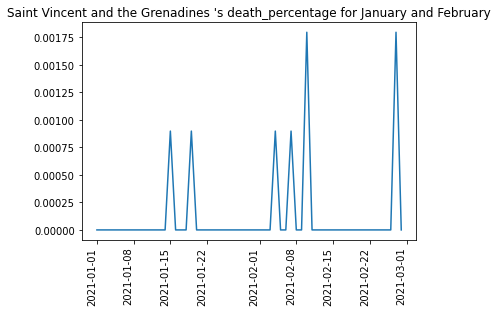

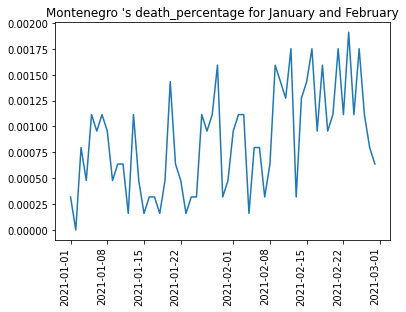

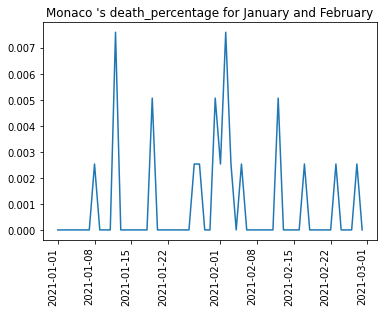

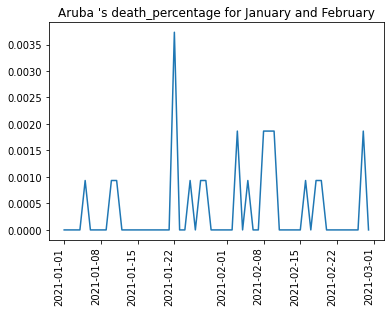

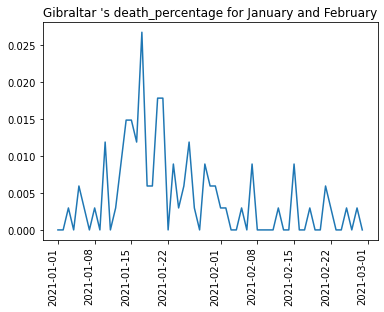

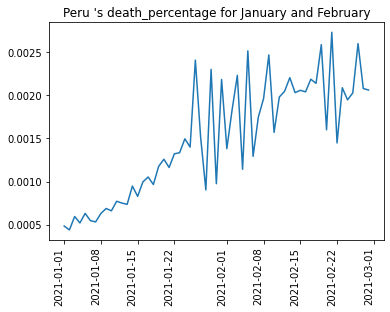

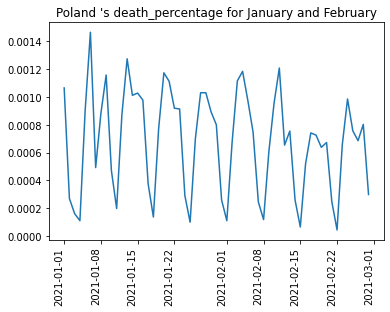

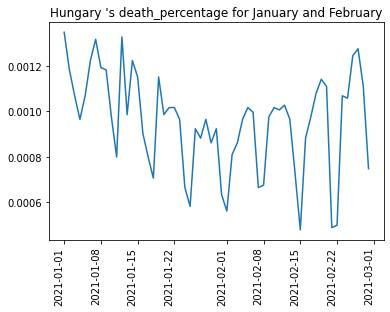

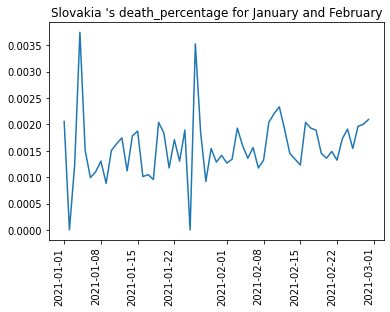

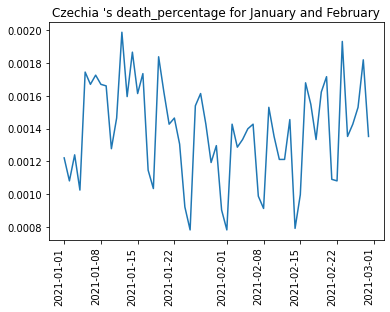

In [ ]:
print("Τhe countries with the highest death percentage")
for country in countries:
  df_country = df.filter(df.location == country)

  dates = df_country.select('date').rdd.map(lambda x : x[0]).collect()
  death_percentage = df_country.select('death_percentage').rdd.map(lambda x : x[0]).collect()
  if len(death_percentage) > len(dates):
    death_percentage.extend([0] * (len(death_percentage)-len(dates)))
#    dates_list = [dt.datetime.strptime(date, "%Y-%m-%d").date() for date in dates]

  fig, ax = plt.subplots()
  plt.setp(ax.get_xticklabels(), rotation=90, horizontalalignment='right', fontsize='medium')
  plt.title("{} 's death_percentage for January and February" .format(country))
  plt.plot(dates, death_percentage)

plt.show()

2. 
What are the top ten countries in terms of cases per million and how did the relevant ranking evolve over time?

In [ ]:
df_last = df_last.sort(df_last.new_cases_per_million.desc())
df_first = df_first.sort(df_first.new_cases_per_million.desc())

print('The countries with the most total cases per million value in the first day of January in 2021 are: ', df_first.limit(10).select('location').rdd.map(lambda x : x[0]).collect())
print('The countries with the most total cases per million value in the last day of February in 2021 are: ', df_last.limit(10).select('location').rdd.map(lambda x : x[0]).collect())

The countries with the most total cases per million value in the first day of January in 2021 are:  ['Gibraltar', 'San Marino', 'United Kingdom', 'United States', 'Ireland', 'Israel', 'Andorra', 'Lithuania', 'Panama', 'Netherlands']
The countries with the most total cases per million value in the last day of February in 2021 are:  ['San Marino', 'Czechia', 'Estonia', 'Slovakia', 'Montenegro', 'Hungary', 'Serbia', 'Malta', 'Lebanon', 'Slovenia']


We can see that in the meantime between January and February, San Marino has been the country with the most cases per million in that period. On the other hand, Giblartar was the first until January, it seems that in that period of time, it has reduced, or the same cases per million and has been passed by other countries.

We can also examine how the total cases per million evolved through time, for January and February for the countries above

Τhe countries with the highest number of total cases per million


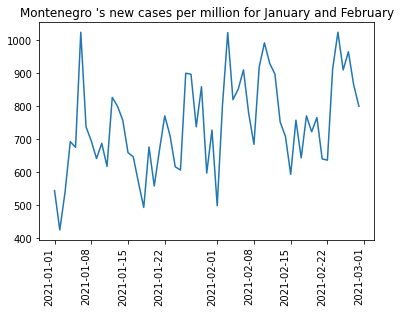

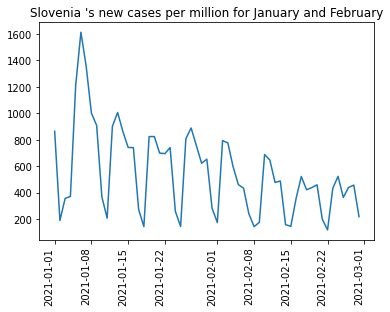

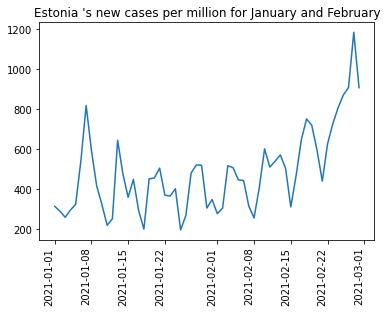

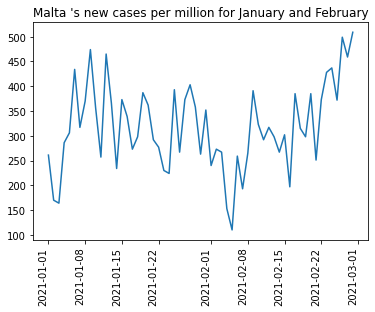

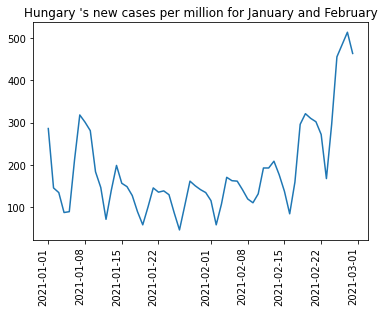

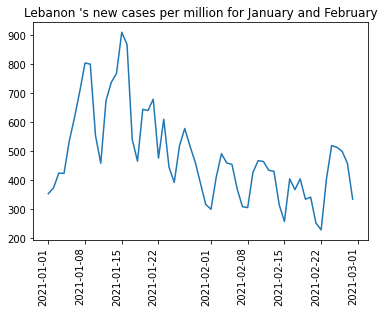

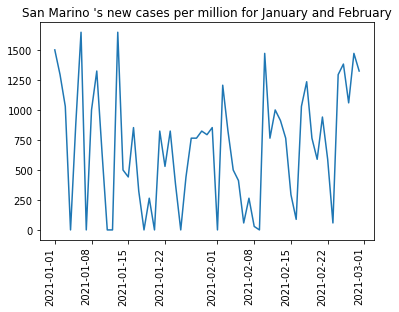

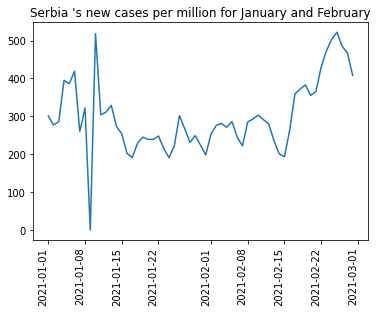

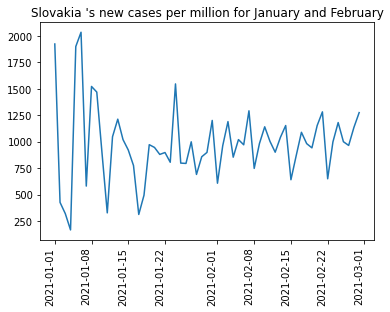

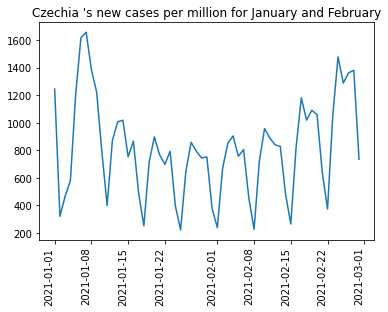

In [ ]:
countries = list((set((df_last.limit(10).select('location').rdd.map(lambda x : x[0]).collect()))))

print("Τhe countries with the highest number of total cases per million")
for country in countries:
  df_country = df.filter(df.location == country)

  dates = df_country.select('date').rdd.map(lambda x : x[0]).collect()
  new_cases_per_million = df_country.select('new_cases_per_million').rdd.map(lambda x : x[0]).collect()
  if len(new_cases_per_million) == len(dates):
 #   dates_list = [dt.datetime.strptime(date, "%Y-%m-%d").date() for date in dates]
    fig, ax = plt.subplots()
    plt.setp(ax.get_xticklabels(), rotation=90, horizontalalignment='right', fontsize='medium')
    plt.title("{} 's new cases per million for January and February" .format(country))
    plt.plot(dates, new_cases_per_million)

plt.show()

3. 
What are the top ten countries in terms of deaths per million and how did the relevant ranking evolve over time?

In [ ]:
df_last = df_last.sort(df_last.new_deaths_per_million.desc())
df_first = df_first.sort(df_first.new_deaths_per_million.desc())

print('The countries with the most new deaths per million value until January in 2021 are: ', df_first.limit(10).select('location').rdd.map(lambda x : x[0]).collect())
print('The countries with the most new deaths per million value until February in 2021 are: ', df_last.limit(10).select('location').rdd.map(lambda x : x[0]).collect())

The countries with the most new deaths per million value until January in 2021 are:  ['Slovenia', 'Lithuania', 'Croatia', 'Latvia', 'Hungary', 'Georgia', 'Czechia', 'Eswatini', 'Panama', 'Portugal']
The countries with the most new deaths per million value until February in 2021 are:  ['Gibraltar', 'Monaco', 'Peru', 'Slovakia', 'Czechia', 'Aruba', 'Saint Vincent and the Grenadines', 'Hungary', 'Poland', 'Montenegro']


Giblartar has been in all the 3 lists above in the period between January and February with a very high death percentage, very high death percentage in January and in the last day of February it seems to be the country with the most deaths per million

We can also examine how the total cases per million evolved through time, for January and February for the countries above

Τhe countries with the highest number of new deaths per million


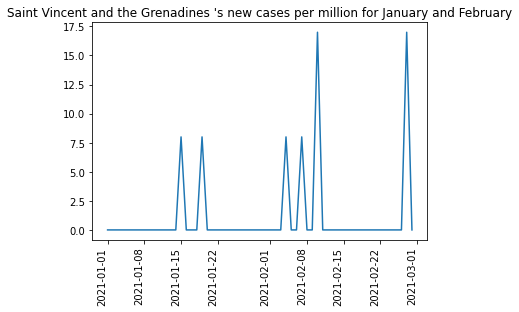

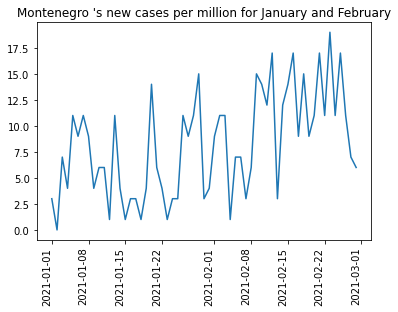

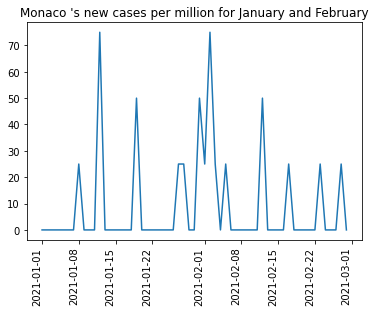

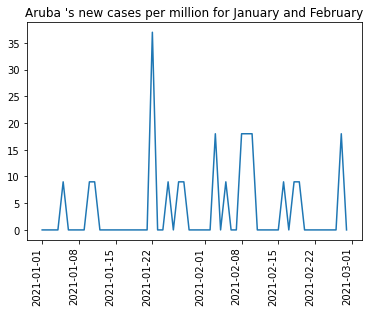

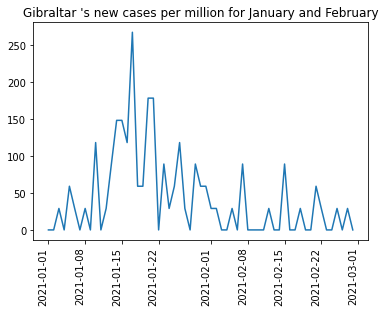

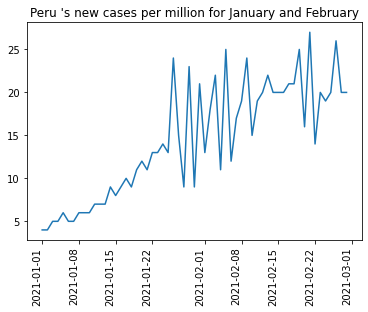

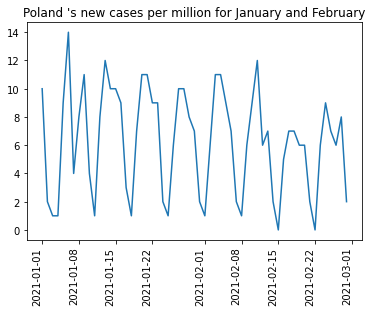

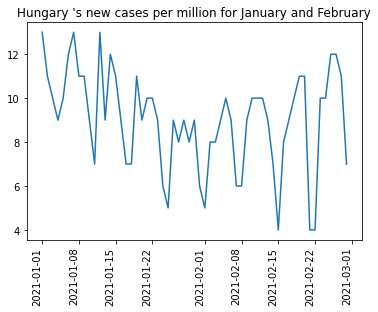

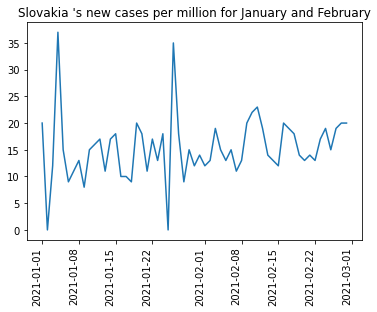

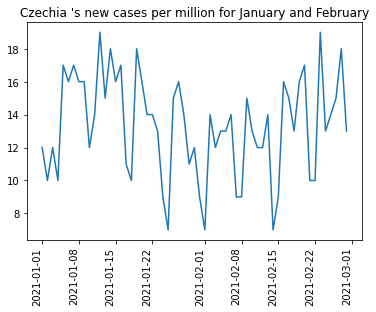

In [ ]:
countries = list((set((df_last.limit(10).select('location').rdd.map(lambda x : x[0]).collect()))))

print("Τhe countries with the highest number of new deaths per million")
for country in countries:
  df_country = df.filter(df.location == country)

  dates = df_country.select('date').rdd.map(lambda x : x[0]).collect()
  new_deaths_per_million = df_country.select('new_deaths_per_million').rdd.map(lambda x : x[0]).collect()
  if len(new_deaths_per_million) == len(dates):
#    dates_list = [dt.datetime.strptime(date, "%Y-%m-%d").date() for date in dates]
    fig, ax = plt.subplots()
    plt.setp(ax.get_xticklabels(), rotation=90, horizontalalignment='right', fontsize='medium')
    plt.title("{} 's new cases per million for January and February" .format(country))
    plt.plot(dates, new_deaths_per_million)

plt.show()

4. 
What is the daily percentage of positivity per country?

In [ ]:
print("Positive rate for each country for the period January-February 2021")
print(df_init.select(col("location"),col("date"), col("positive_rate")).show(10))

Positive rate for each country for the period January-February 2021
+-----------+----------+-------------+
|   location|      date|positive_rate|
+-----------+----------+-------------+
|Afghanistan|2021-01-01|          0.0|
|Afghanistan|2021-01-02|          0.0|
|Afghanistan|2021-01-03|          0.0|
|Afghanistan|2021-01-04|          0.0|
|Afghanistan|2021-01-05|          0.0|
|Afghanistan|2021-01-06|          0.0|
|Afghanistan|2021-01-07|          0.0|
|Afghanistan|2021-01-08|          0.0|
|Afghanistan|2021-01-09|          0.0|
|Afghanistan|2021-01-10|          0.0|
+-----------+----------+-------------+
only showing top 10 rows

None


Positivity for every country


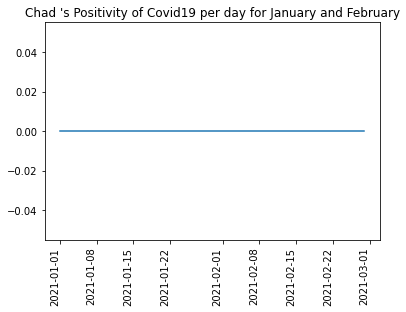

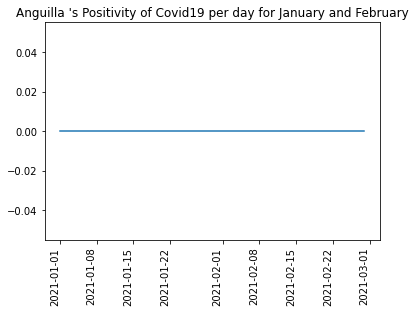

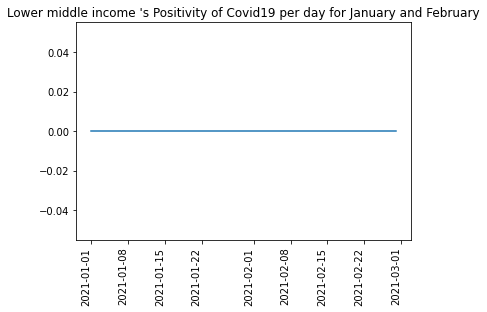

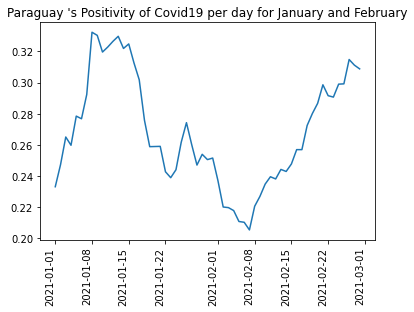

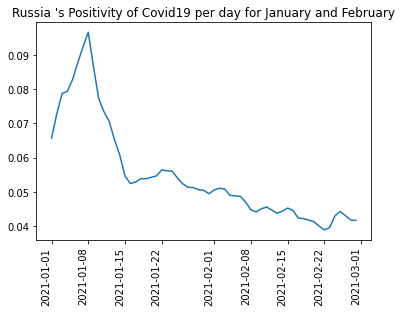

...

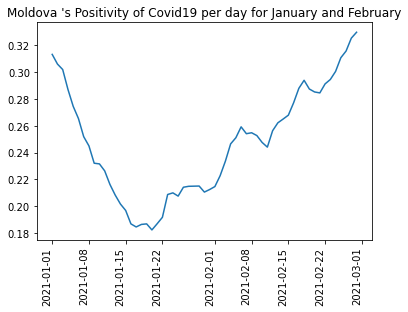

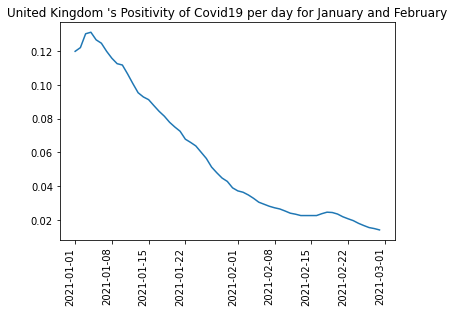

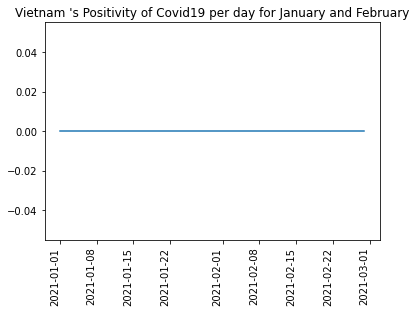

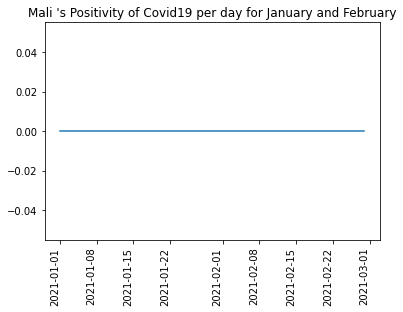

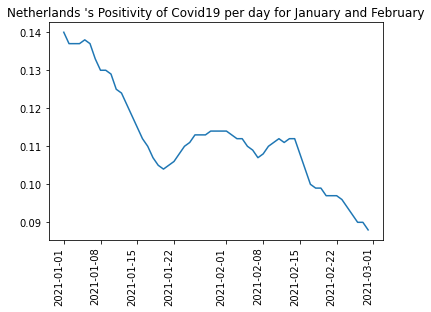

In [ ]:
df_initt = df_init
df_init = df_init.withColumn('date', to_date('date'))

countries = df_init.select('location').distinct().rdd.map(lambda x : x[0]).collect()

print("Positivity for every country")
for country in countries:
  df_country = df_init.filter(df_init.location == country)

  dates = df_country.select('date').rdd.map(lambda x : x[0]).collect()
  positive_rate = df_country.select('positive_rate').rdd.map(lambda x : x[0]).collect()
  if len(positive_rate) == len(dates):
#    dates_list = [dt.datetime.strptime(date, "%Y-%m-%d").date() for date in dates]
    fig, ax = plt.subplots()
    plt.setp(ax.get_xticklabels(), rotation=90, horizontalalignment='right', fontsize='medium')
    plt.title("{} 's Positivity of Covid19 per day for January and February" .format(country))
    plt.plot(dates, positive_rate)

plt.show()
df_init = df_initt

5. 
Draw the curves of hospitalized patients as well as intensive care units (ICUs).

In [ ]:
df_gr = df.filter(df.location == "Greece")
df_it = df.filter(df.location == "Italy")

In [ ]:
dates = df_gr.select('date').rdd.map(lambda x : x[0]).collect()
hosp_patients_gr = df_gr.select('hosp_patients').rdd.map(lambda x : x[0]).collect()
hosp_patients_it = df_it.select('hosp_patients').rdd.map(lambda x : x[0]).collect()

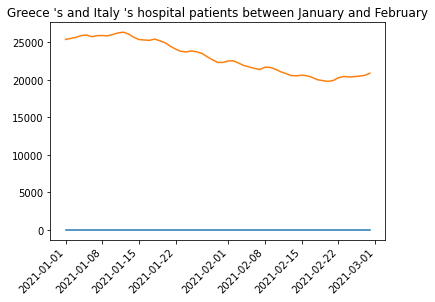

In [ ]:
fig, ax = plt.subplots()
plt.setp(ax.get_xticklabels(), rotation=45, horizontalalignment='right', fontsize='medium')
plt.title("Greece 's and Italy 's hospital patients between January and February")
plt.plot(dates, hosp_patients_gr)
plt.plot(dates, hosp_patients_it)

In [ ]:
df_eu = df.filter(df.continent == "Europe")
df_eu.select('location').distinct().rdd.map(lambda x : x[0]).collect() ## all eu countries

['Russia',
 'Sweden',
 'Germany',
 'France',
 'Greece',
 'Kosovo',
 'Slovakia',
 'Belgium',
 'Vatican',
 'San Marino',
 'Albania',
 'Finland',
 'Guernsey',
 'Belarus',
 'Malta',
 'Isle of Man',
 'Croatia',
 'Andorra',
 'Italy',
 'Lithuania',
 'Norway',
 'Spain',
 'Czechia',
 'Denmark',
 'Ireland',
 'Liechtenstein',
 'Monaco',
 'Ukraine',
 'Iceland',
 'Faeroe Islands',
 'Cyprus',
 'Gibraltar',
 'Estonia',
 'Montenegro',
 'Switzerland',
 'Latvia',
 'North Macedonia',
 'Slovenia',
 'Luxembourg',
 'Bosnia and Herzegovina',
 'Poland',
 'Portugal',
 'Romania',
 'Bulgaria',
 'Austria',
 'Serbia',
 'Hungary',
 'Moldova',
 'United Kingdom',
 'Netherlands']

Number of hospital patients for each country in Europe


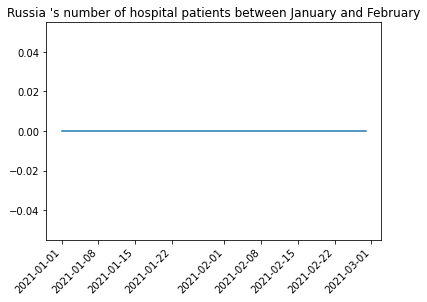

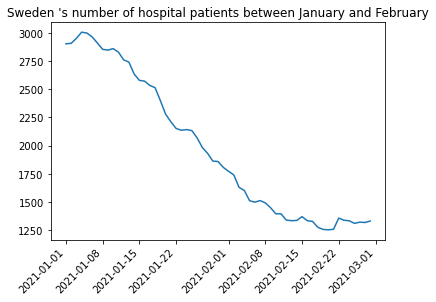

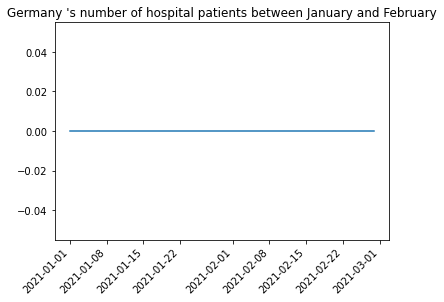

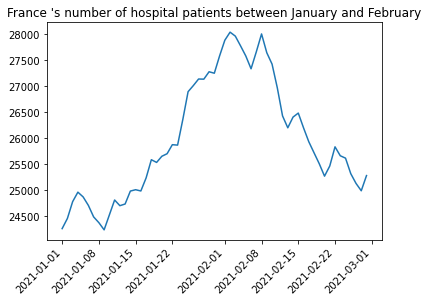

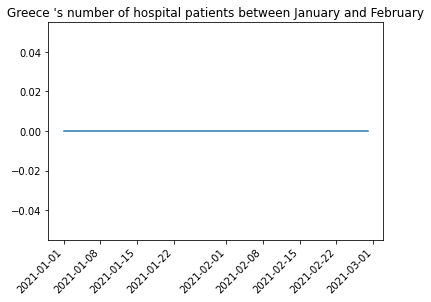

...

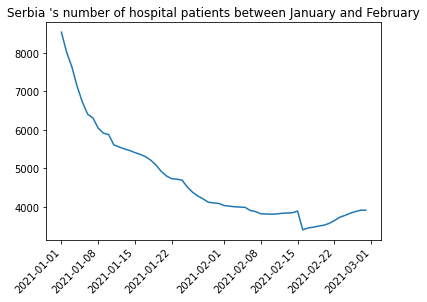

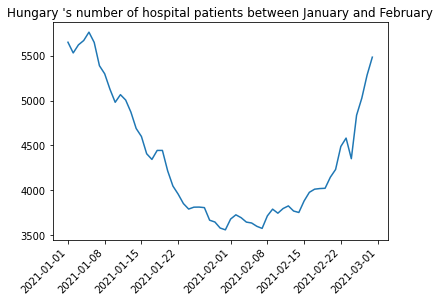

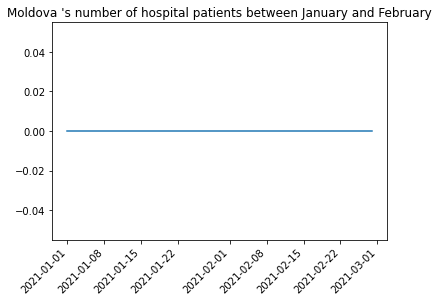

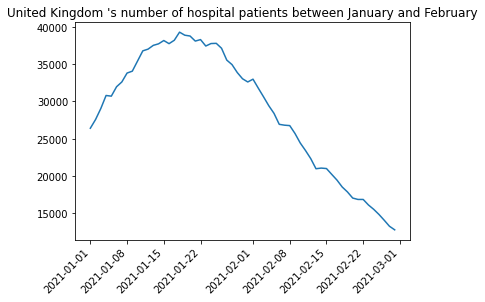

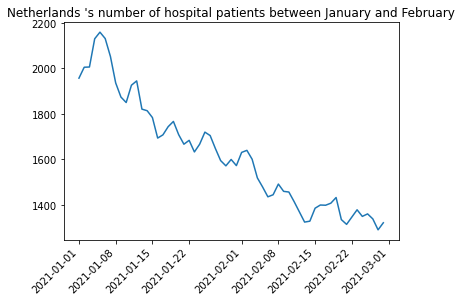

In [ ]:
print("Number of hospital patients for each country in Europe")
for country in df_eu.select('location').distinct().rdd.map(lambda x : x[0]).collect():
  df_country = df.filter(df.location == country)

  hospital_patients_country = df_country.select('hosp_patients').rdd.map(lambda x : x[0]).collect()
  if len(hospital_patients_country) == len(dates):

    fig, ax = plt.subplots()
    plt.setp(ax.get_xticklabels(), rotation=45, horizontalalignment='right', fontsize='medium')
    plt.title("{} 's number of hospital patients between January and February" .format(country))
    plt.plot(dates, hospital_patients_country)

plt.show()



Number of patients in intensive care units for each country in Europe


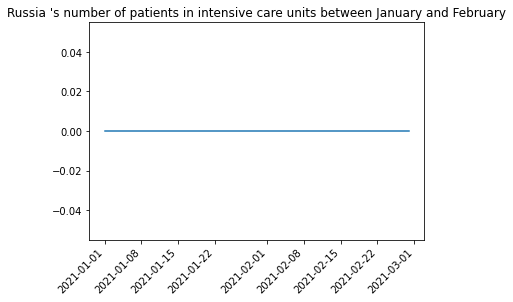

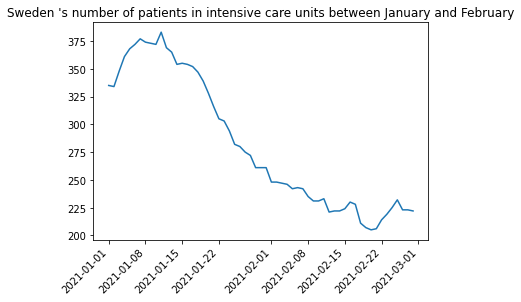

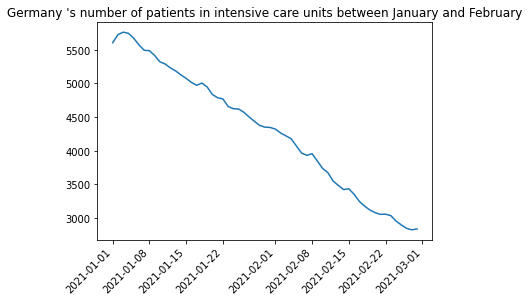

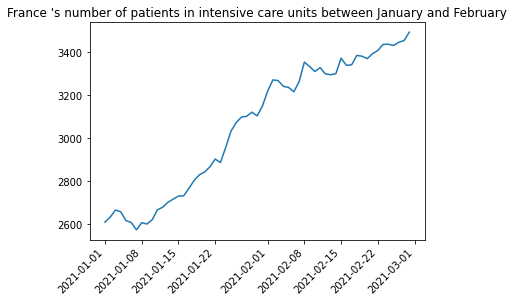

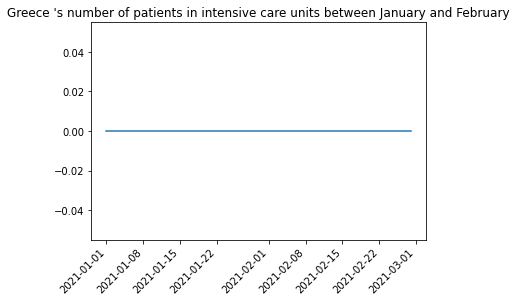

...

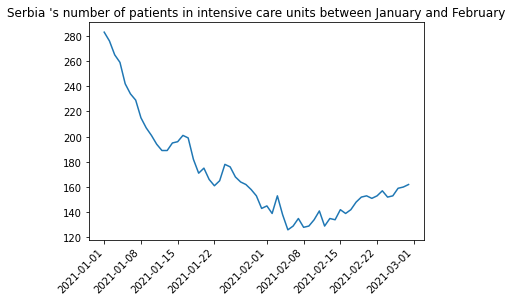

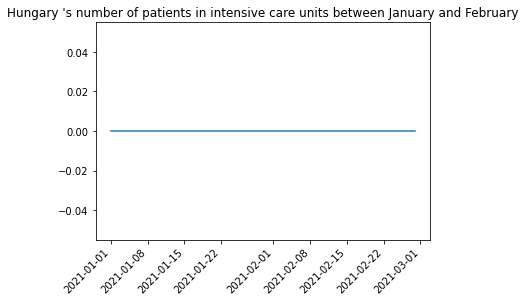

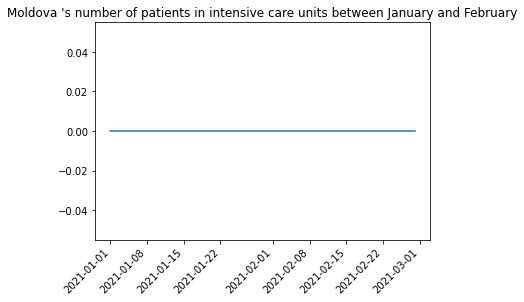

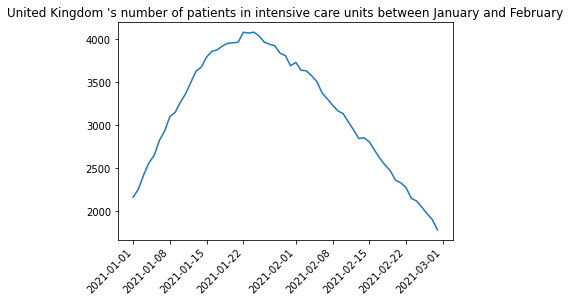

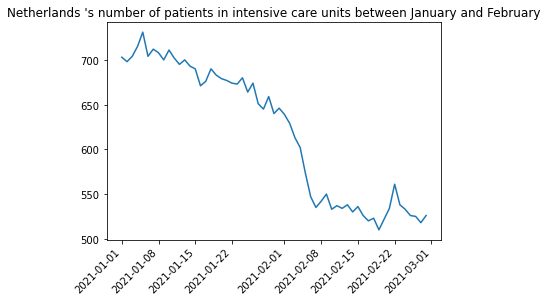

In [ ]:
print("Number of patients in intensive care units for each country in Europe")
for country in df_eu.select('location').distinct().rdd.map(lambda x : x[0]).collect():
  df_country = df.filter(df.location == country)

  icu_patients_country = df_country.select('icu_patients').rdd.map(lambda x : x[0]).collect()
  if len(icu_patients_country) == len(dates):

    fig, ax = plt.subplots()
    plt.setp(ax.get_xticklabels(), rotation=45, horizontalalignment='right', fontsize='medium')
    plt.title("{} 's number of patients in intensive care units between January and February" .format(country))
    plt.plot(dates, icu_patients_country)

plt.show()

6. 
Construct a geographical heatmap of the absolute number of cases

In [ ]:
!pip install geopandas
!pip install geoplot
import geopandas
import geoplot


In [ ]:
world = geopandas.read_file(
    geopandas.datasets.get_path('naturalearth_lowres')
)

In [ ]:
total_cases = df_last.select('total_cases').rdd.map(lambda x : x[0]).collect()
countries = df_last.select('location').rdd.map(lambda x : x[0]).collect()

In [ ]:
#We insert United Stated of America manually
indx = countries.index('United States')
countries[indx] = 'United States of America'

In [ ]:
world['total_cases'] = 0

In [ ]:
for i in range(len(world)):
  country = world['name'][i]
  if country in countries:
    indx = countries.index(country)
    world['total_cases'][i] = total_cases[indx]

Text(0.5, 1.0, 'World heat map of total cases until the last day of February')

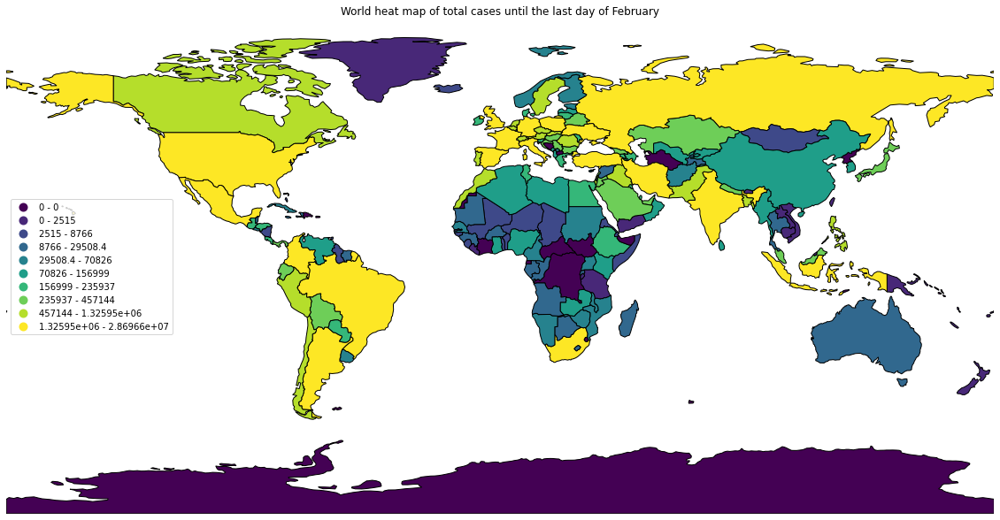

In [ ]:
import mapclassify
gpd = world['total_cases']

scheme = mapclassify.Quantiles(gpd, k=10)
geoplot.choropleth(
    world, hue=gpd, scheme=scheme,
     figsize=(20, 20), legend = True, legend_kwargs={'loc': 'center left'})
plt.title('World heat map of total cases until the last day of February')

7. Find examples of neighboring countries that show the highest correlation of excess mortality

We firstly calculate the countries for different days in the period January-February that have an excess mortality different than zero. Then, in order to specify neighbor countries with almost the same excess mortality we create 5 different dataframes one for each continent.

In [ ]:
df_excess_mort = df.filter(df.excess_mortality>0)
df_excess_mort_eu = df_excess_mort.filter(df_excess_mort.continent == "Europe")
df_excess_mort_as = df_excess_mort.filter(df_excess_mort.continent == "Asia")
df_excess_mort_af = df_excess_mort.filter(df_excess_mort.continent == "Africa")
df_excess_mort_na = df_excess_mort.filter(df_excess_mort.continent == "North America")
df_excess_mort_sa = df_excess_mort.filter(df_excess_mort.continent == "South America")
df_excess_mort_oc = df_excess_mort.filter(df_excess_mort.continent == "Oceania")

In [ ]:
print("Different countries in Europe that have excess mortality different than zero", df_excess_mort_eu.select('location').distinct().rdd.map(lambda x : x[0]).collect())
print("Different countries in Asia that have excess mortality different than zero", df_excess_mort_as.select('location').distinct().rdd.map(lambda x : x[0]).collect())
print("Different countries in Africa that have excess mortality different than zero", df_excess_mort_af.select('location').distinct().rdd.map(lambda x : x[0]).collect())
print("Different countries in North America that have excess mortality different than zero", df_excess_mort_na.select('location').distinct().rdd.map(lambda x : x[0]).collect())
print("Different countries in South America that have excess mortality different than zero", df_excess_mort_sa.select('location').distinct().rdd.map(lambda x : x[0]).collect())
print("Different countries in Oceania that have excess mortality different than zero", df_excess_mort_oc.select('location').distinct().rdd.map(lambda x : x[0]).collect())


Different countries in Europe that have excess mortality different than zero ['Russia', 'Sweden', 'Germany', 'France', 'Greece', 'Kosovo', 'Slovakia', 'Belgium', 'San Marino', 'Albania', 'Finland', 'Belarus', 'Malta', 'Croatia', 'Italy', 'Lithuania', 'Spain', 'Czechia', 'Denmark', 'Ireland', 'Liechtenstein', 'Monaco', 'Ukraine', 'Iceland', 'Faeroe Islands', 'Cyprus', 'Gibraltar', 'Estonia', 'Montenegro', 'Switzerland', 'Latvia', 'North Macedonia', 'Slovenia', 'Luxembourg', 'Bosnia and Herzegovina', 'Poland', 'Portugal', 'Romania', 'Bulgaria', 'Austria', 'Serbia', 'Hungary', 'Moldova', 'United Kingdom', 'Netherlands']
Different countries in Asia that have excess mortality different than zero ['Macao', 'Philippines', 'Singapore', 'Taiwan', 'Qatar', 'Iran', 'Thailand', 'Hong Kong', 'Israel', 'Georgia', 'Azerbaijan', 'Armenia', 'Kyrgyzstan', 'Uzbekistan', 'Lebanon', 'Kazakhstan']
Different countries in Africa that have excess mortality different than zero ['Tunisia', 'Seychelles', 'Egypt',

In Europe an example of neighboring countries that have excess mortality different than zero are France, Germany, Belgium and Italy.

In [ ]:
df_excess_mort_eu = df_excess_mort_eu.filter((df_excess_mort_eu.location == "France") | (df_excess_mort_eu.location == "Italy") | (df_excess_mort_eu.location == "Germany") | (df_excess_mort_eu.location == "Belgium"))
df_excess_mort_sa = df_excess_mort_sa.filter((df_excess_mort_sa.location == "Bolivia") | (df_excess_mort_sa.location == "Brazil"))

In [ ]:
df_excess_mort_eu.select("location", "date", "excess_mortality").show(30)
df_excess_mort_sa.select("location", "date", "excess_mortality").show(30)

+--------+----------+----------------+
|location|      date|excess_mortality|
+--------+----------+----------------+
| Belgium|2021-01-03|               9|
| Belgium|2021-01-10|               4|
| Belgium|2021-01-24|               1|
| Belgium|2021-01-31|               1|
|  France|2021-01-03|              11|
|  France|2021-01-10|               6|
|  France|2021-01-17|               4|
|  France|2021-01-24|              11|
|  France|2021-01-31|               9|
|  France|2021-02-07|               7|
|  France|2021-02-14|               4|
|  France|2021-02-21|               5|
| Germany|2021-01-03|              35|
| Germany|2021-01-10|              25|
| Germany|2021-01-17|              21|
| Germany|2021-01-24|              19|
| Germany|2021-01-31|              11|
| Germany|2021-02-07|               3|
|   Italy|2021-01-03|              17|
|   Italy|2021-01-10|               9|
|   Italy|2021-01-17|               8|
|   Italy|2021-01-24|              11|
|   Italy|2021-01-31|    

8. 
Estimate the spread of the infection through the reproduction rate (reproduction rate) in all Continents except Antarctica

In [ ]:
df_eu = df_init.filter(df.continent == "Europe")
df_eu = df_eu.sort(df_eu.reproduction_rate.desc())

df_as = df_init.filter(df.continent == "Asia")
df_as = df_init.sort(df_as.reproduction_rate.desc())

df_af = df_init.filter(df.continent == "Africa")
df_af = df_af.sort(df_af.reproduction_rate.desc())

df_na = df_init.filter(df.continent == "North America")
df_na = df_na.sort(df_na.reproduction_rate.desc())

df_sa = df_init.filter(df.continent == "South America")
df_sa = df_sa.sort(df_sa.reproduction_rate.desc())

df_oc = df_init.filter(df.continent == "Oceania")
df_oc = df_oc.sort(df_oc.reproduction_rate.desc())

In [ ]:
print("To examine the evolution of reproduction rate check every 2 days\n")
print("For every continent examine reproduction rate and show the first 5 continents with the highest\n")
for i in range(0, len(dates), 2):
  print("Reproduction rate for Europe {}" .format(dates[i])) 
  df_eu_date = df_eu.filter(df_eu.date == dates[i])
  df_eu_date.select("continent", "location", "reproduction_rate", "date").show(5)

  print("Reproduction rate for Asia {}" .format(dates[i])) 
  df_as_date = df_as.filter(df_as.date == dates[i])
  df_as_date.select("continent", "location", "reproduction_rate", "date").show(5)

  print("Reproduction rate for Africa {}" .format(dates[i])) 
  df_af_date = df_af.filter(df_af.date == dates[i])
  df_af_date.select("continent", "location", "reproduction_rate", "date").show(5)

  print("Reproduction rate for South America {}" .format(dates[i])) 
  df_sa_date = df_sa.filter(df_sa.date == dates[i])
  df_sa_date.select("continent", "location", "reproduction_rate", "date").show(5)

  print("Reproduction rate for North America {}" .format(dates[i])) 
  df_na_date = df_na.filter(df_na.date == dates[i])
  df_na_date.select("continent", "location", "reproduction_rate", "date").show(5)



To examine the evolution of reproduction rate check every 2 days

For every continent examine reproduction rate and show the first 5 continents with the highest

Reproduction rate for Europe 2021-01-01
+---------+--------+-----------------+----------+
|continent|location|reproduction_rate|      date|
+---------+--------+-----------------+----------+
|   Europe| Ireland|             1.95|2021-01-01|
|   Europe|  Sweden|             1.37|2021-01-01|
|   Europe|   Spain|             1.32|2021-01-01|
|   Europe|Portugal|             1.31|2021-01-01|
|   Europe|  Monaco|             1.29|2021-01-01|
+---------+--------+-----------------+----------+
only showing top 5 rows

Reproduction rate for Asia 2021-01-01
+---------+------------+-----------------+----------+
|continent|    location|reproduction_rate|      date|
+---------+------------+-----------------+----------+
|   Africa|      Malawi|             2.14|2021-01-01|
|   Europe|     Ireland|             1.95|2021-01-01|
|   Africa|    

In [ ]:
df_eu.select('continent', 'location', 'reproduction_rate').show()

+---------+--------+-----------------+
|continent|location|reproduction_rate|
+---------+--------+-----------------+
|   Europe| Ireland|              2.1|
|   Europe| Ireland|             2.09|
|   Europe| Ireland|             2.05|
|   Europe| Ireland|             2.01|
|   Europe| Ireland|             1.95|
|   Europe| Ireland|             1.91|
|   Europe| Ireland|             1.78|
|   Europe| Ireland|             1.64|
|   Europe|   Spain|             1.55|
|   Europe|   Spain|             1.55|
|   Europe|   Spain|             1.55|
|   Europe|   Spain|             1.55|
|   Europe|   Spain|             1.55|
|   Europe|   Spain|             1.53|
|   Europe|   Spain|             1.52|
|   Europe|   Spain|              1.5|
|   Europe|   Spain|             1.49|
|   Europe| Ireland|             1.49|
|   Europe|   Spain|             1.47|
|   Europe|   Spain|             1.47|
+---------+--------+-----------------+
only showing top 20 rows



9. View daily country-by-country diagnostics.

In [ ]:
df_eu = df.filter(df.continent == "Europe")
df_as = df.filter(df.continent == "Asia")
df_af = df.filter(df.continent == "Africa")
df_na = df.filter(df.continent == "North America")
df_sa = df.filter(df.continent == "South America")
df_oc = df.filter(df.continent == "Oceania")


European countries

Number of new_tests for each country in Europe


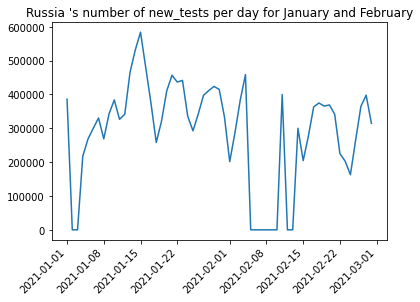

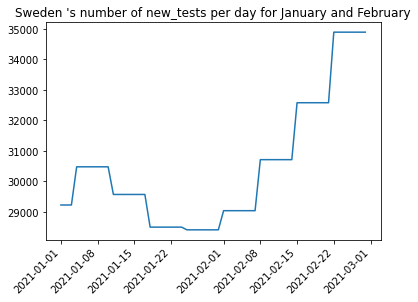

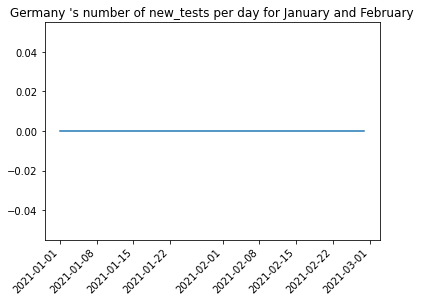

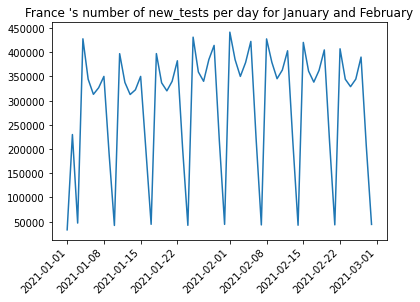

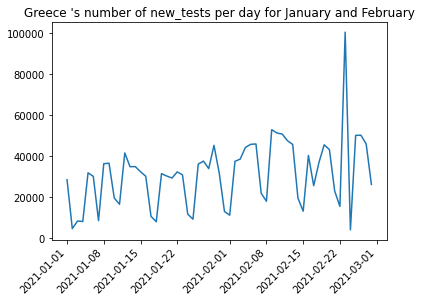

...

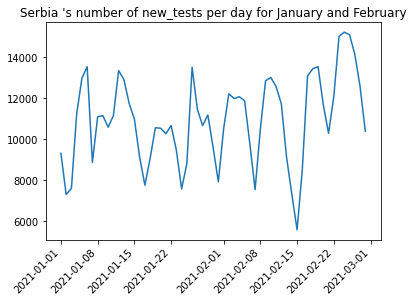

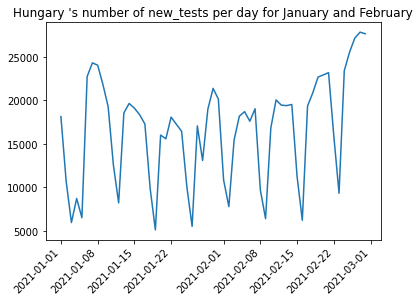

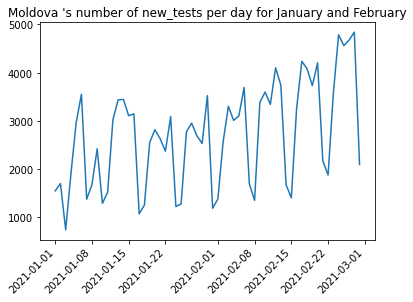

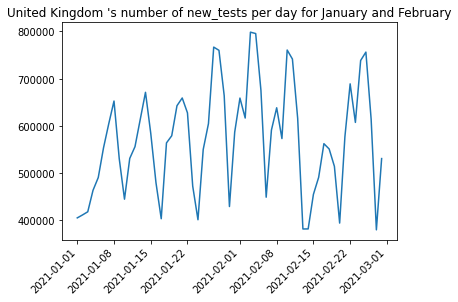

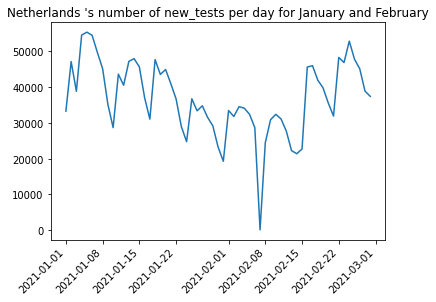

In [ ]:
print("Number of new_tests for each country in Europe")
for country in df_eu.select('location').distinct().rdd.map(lambda x : x[0]).collect():
  df_country = df.filter(df.location == country)

  new_tests = df_country.select('new_tests').rdd.map(lambda x : x[0]).collect()
  if len(new_tests) == len(dates):

    fig, ax = plt.subplots()
    plt.setp(ax.get_xticklabels(), rotation=45, horizontalalignment='right', fontsize='medium')
    plt.title("{} 's number of new_tests per day for January and February" .format(country))
    plt.plot(dates, new_tests)

plt.show()

Asian countries

Number of new_tests for each country in Asia


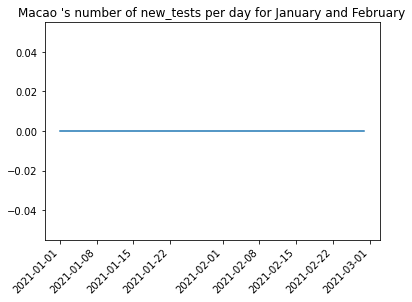

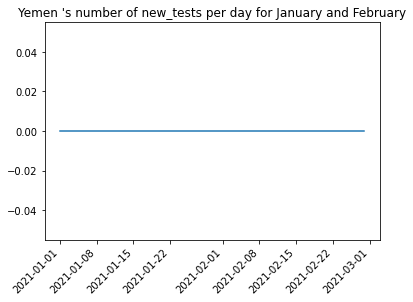

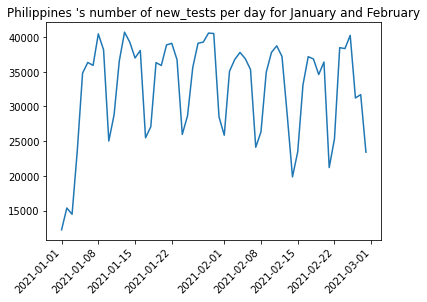

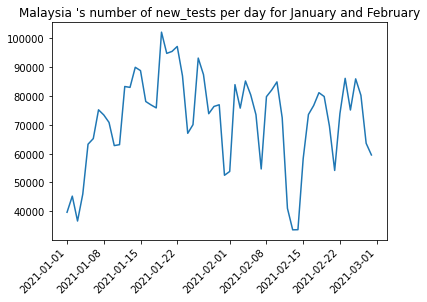

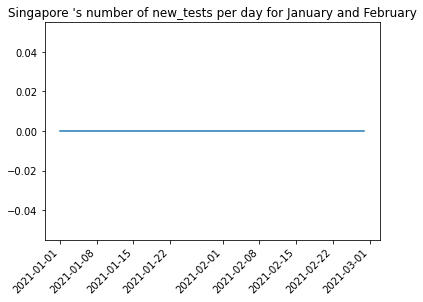

...

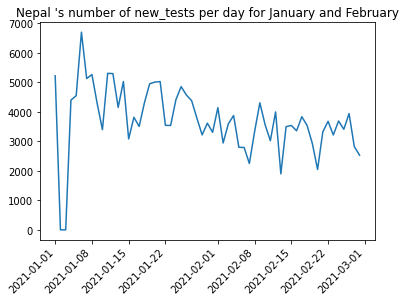

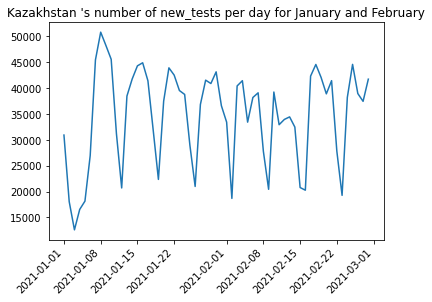

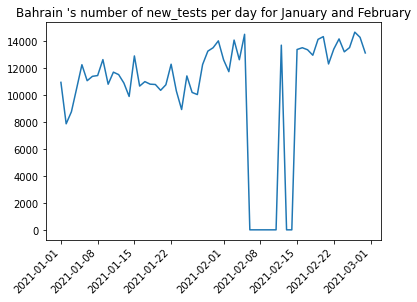

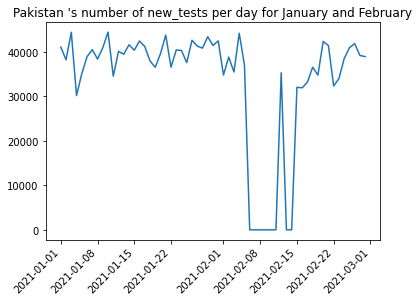

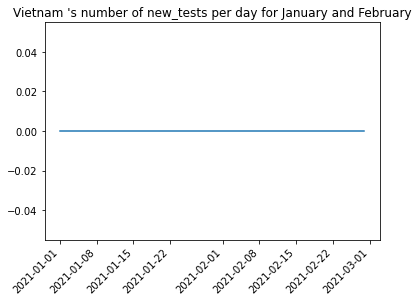

In [ ]:
print("Number of new_tests for each country in Asia")
for country in df_as.select('location').distinct().rdd.map(lambda x : x[0]).collect():
  df_country = df.filter(df.location == country)

  new_tests = df_country.select('new_tests').rdd.map(lambda x : x[0]).collect()
  if len(new_tests) == len(dates):

    fig, ax = plt.subplots()
    plt.setp(ax.get_xticklabels(), rotation=45, horizontalalignment='right', fontsize='medium')
    plt.title("{} 's number of new_tests per day for January and February" .format(country))
    plt.plot(dates, new_tests)

plt.show()

African countries

Number of new_tests for each country in Africa


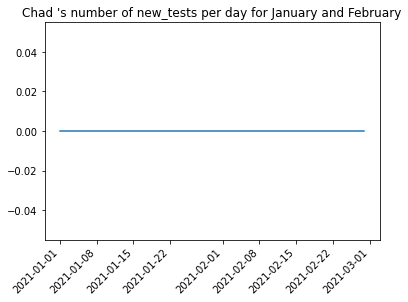

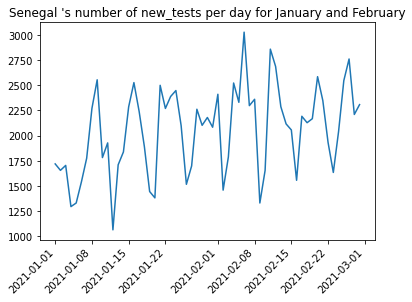

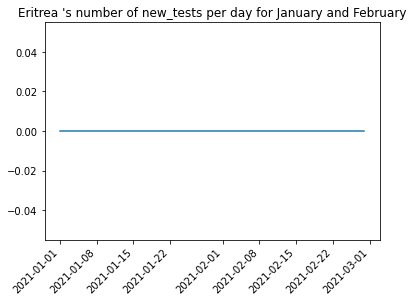

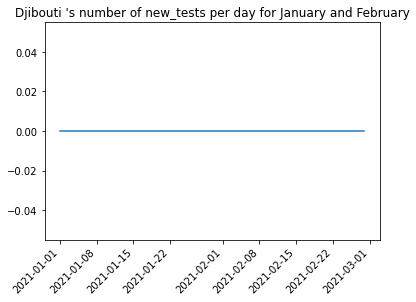

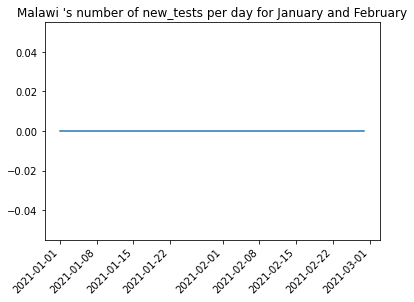

...

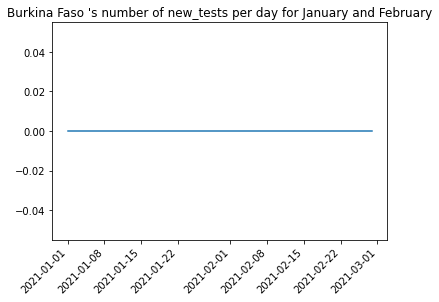

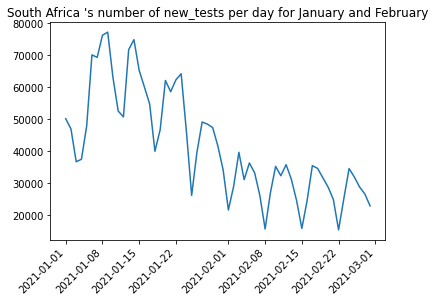

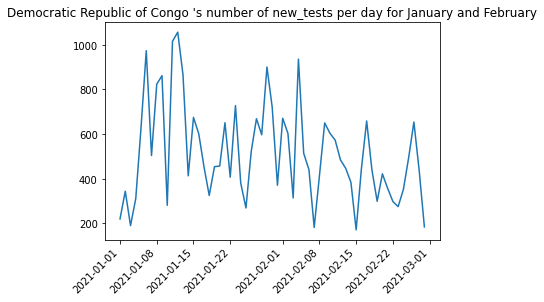

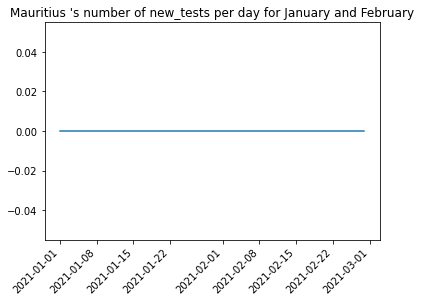

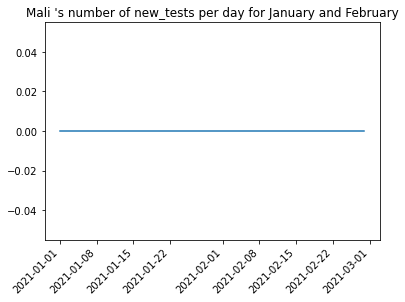

In [ ]:
print("Number of new_tests for each country in Africa")
for country in df_af.select('location').distinct().rdd.map(lambda x : x[0]).collect():
  df_country = df.filter(df.location == country)

  new_tests = df_country.select('new_tests').rdd.map(lambda x : x[0]).collect()
  if len(new_tests) == len(dates):

    fig, ax = plt.subplots()
    plt.setp(ax.get_xticklabels(), rotation=45, horizontalalignment='right', fontsize='medium')
    plt.title("{} 's number of new_tests per day for January and February" .format(country))
    plt.plot(dates, new_tests)

plt.show()

North American countries

Number of new_tests for each country in North America


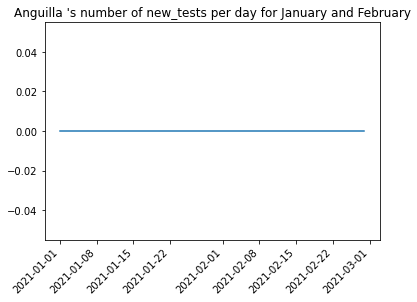

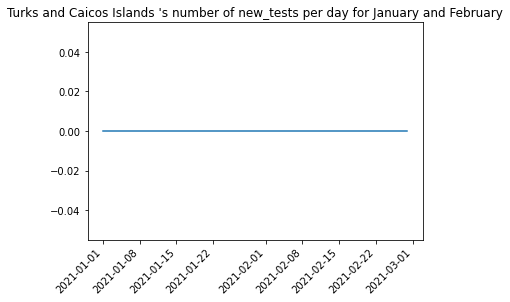

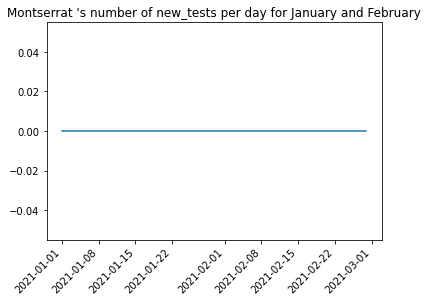

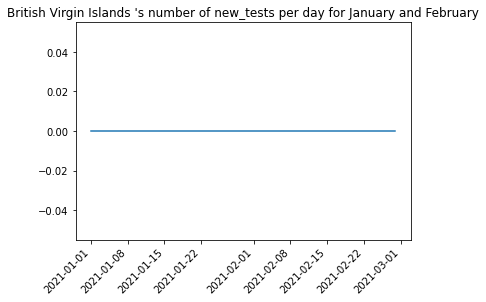

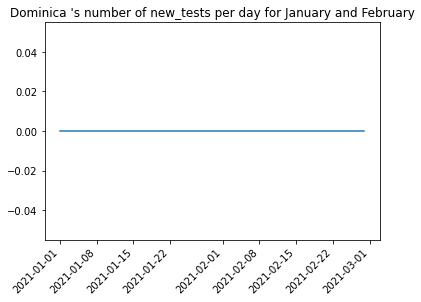

...

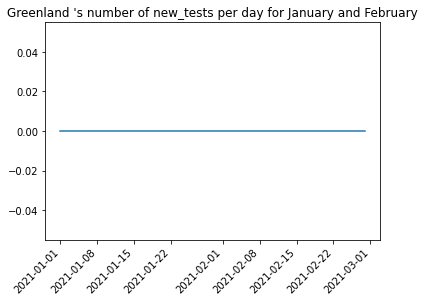

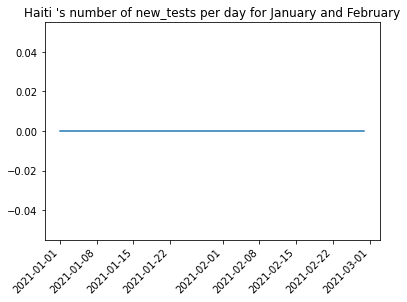

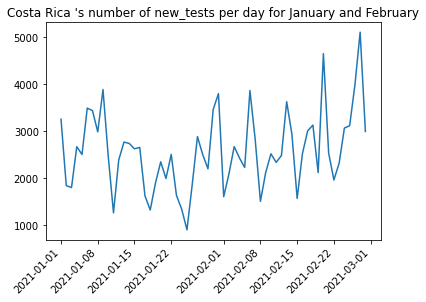

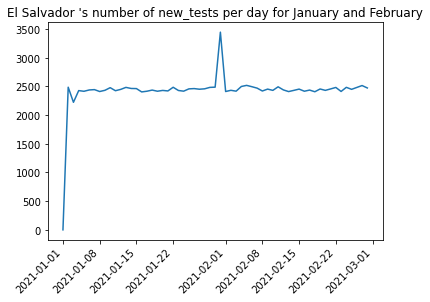

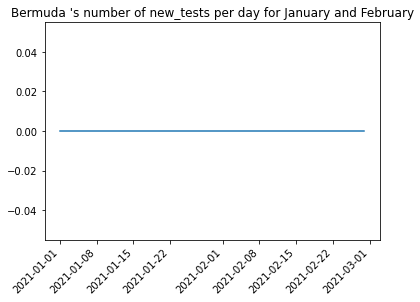

In [ ]:
print("Number of new_tests for each country in North America")
for country in df_na.select('location').distinct().rdd.map(lambda x : x[0]).collect():
  df_country = df.filter(df.location == country)

  new_tests = df_country.select('new_tests').rdd.map(lambda x : x[0]).collect()
  if len(new_tests) == len(dates):

    fig, ax = plt.subplots()
    plt.setp(ax.get_xticklabels(), rotation=45, horizontalalignment='right', fontsize='medium')
    plt.title("{} 's number of new_tests per day for January and February" .format(country))
    plt.plot(dates, new_tests)

plt.show()

South American countries

Number of new_tests for each country in South America


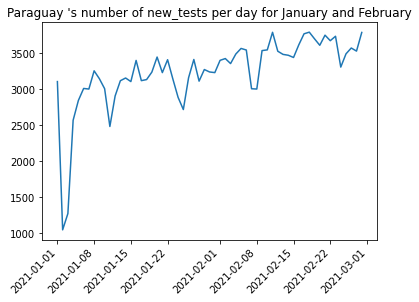

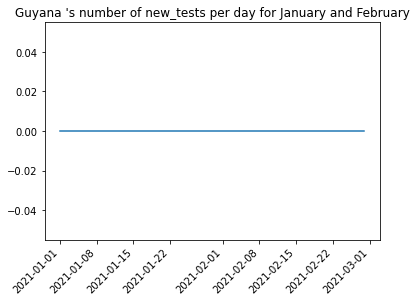

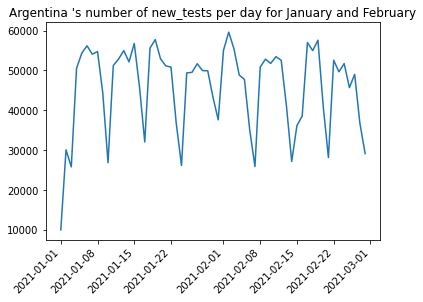

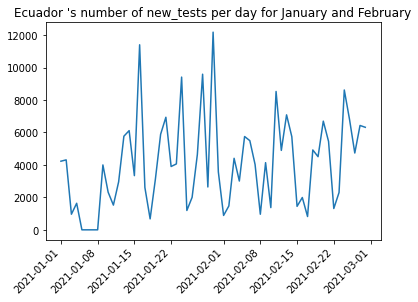

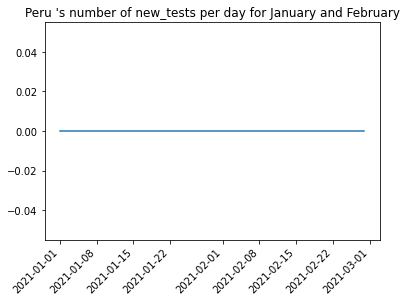

...

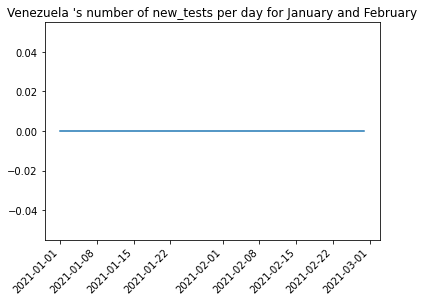

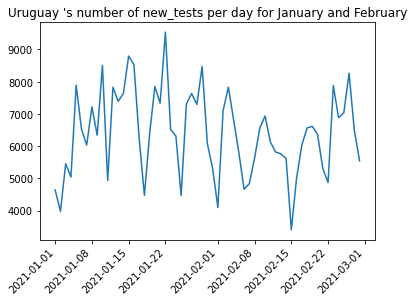

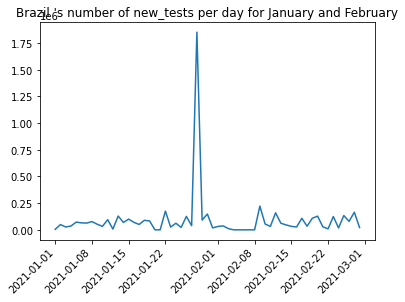

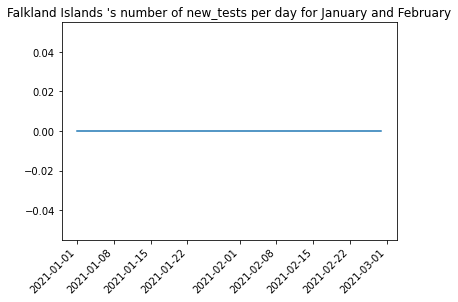

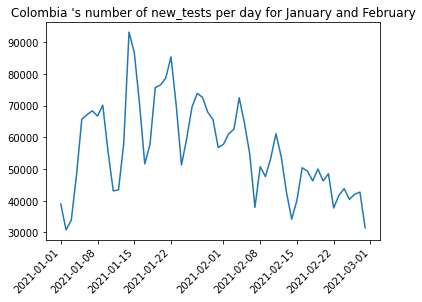

In [ ]:
print("Number of new_tests for each country in South America")
for country in df_sa.select('location').distinct().rdd.map(lambda x : x[0]).collect():
  df_country = df.filter(df.location == country)

  new_tests = df_country.select('new_tests').rdd.map(lambda x : x[0]).collect()
  if len(new_tests) == len(dates):

    fig, ax = plt.subplots()
    plt.setp(ax.get_xticklabels(), rotation=45, horizontalalignment='right', fontsize='medium')
    plt.title("{} 's number of new_tests per day for January and February" .format(country))
    plt.plot(dates, new_tests)

plt.show()

Oceanian countries

Number of new_tests for each country in Oceania


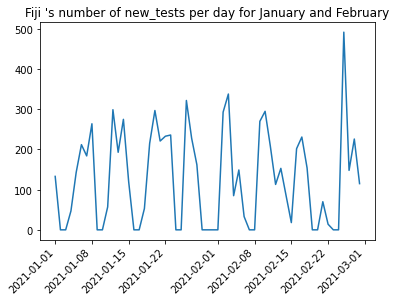

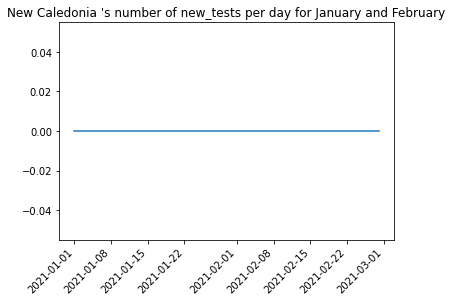

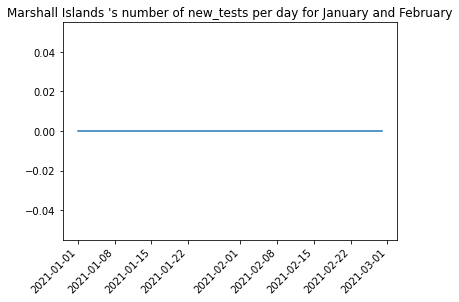

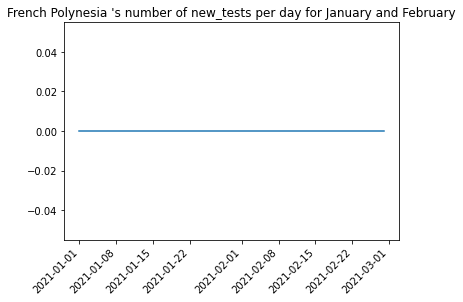

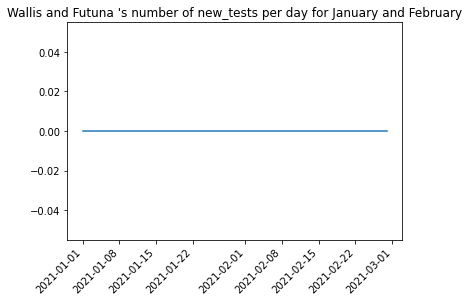

...

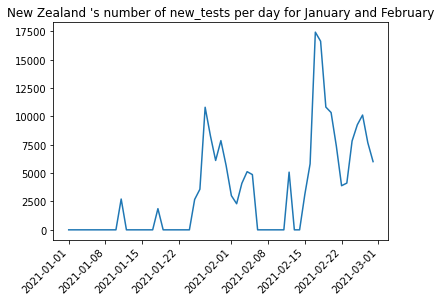

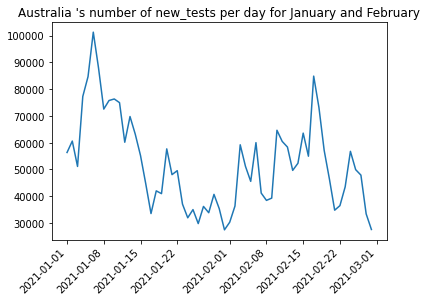

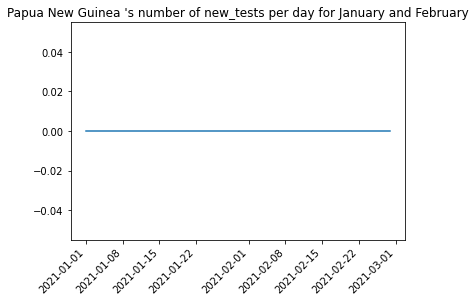

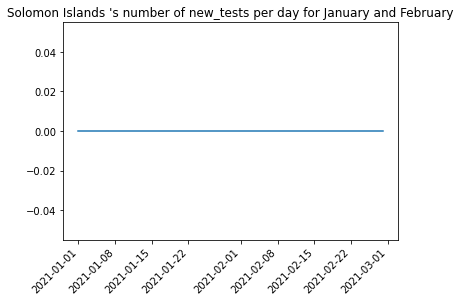

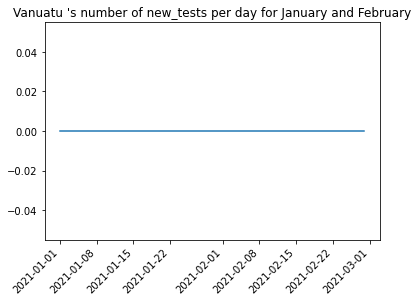

In [ ]:
print("Number of new_tests for each country in Oceania")
for country in df_oc.select('location').distinct().rdd.map(lambda x : x[0]).collect():
  df_country = df.filter(df.location == country)

  new_tests = df_country.select('new_tests').rdd.map(lambda x : x[0]).collect()
  if len(new_tests) == len(dates):

    fig, ax = plt.subplots()
    plt.setp(ax.get_xticklabels(), rotation=45, horizontalalignment='right', fontsize='medium')
    plt.title("{} 's number of new_tests per day for January and February" .format(country))
    plt.plot(dates, new_tests)

plt.show()

10. Study the correlation between the number of coronavirus tests and excessive mortality and show the countries with the highest and lowest correlations

In [ ]:
corr_country = []
corr_corr = []

for country in df.select('location').distinct().rdd.map(lambda x : x[0]).collect():
  df_country = df.filter(df.location == country)
  corr = df_country.stat.corr('total_tests', 'excess_mortality')
  corr_country.append(country)
  corr_corr.append(corr)

In [ ]:
corr = []
corr_c = []

for i in range(len(corr_corr)):
  if not math.isnan(corr_corr[i]):
    corr.append(corr_corr[i])
    corr_c.append(corr_country[i])

corr, corr_c = zip(*sorted(zip(corr, corr_c)))

print("The 3 countries with the lowest correleation between total tests and excess mortality are : {0} with {1} correlations" .format(corr_c[0:3], corr[0:3]))
print("The 3 countries with the highest correleation between total tests and excess mortality are : {0} with {1} correlations" .format(corr_c[len(corr)-3:], corr[len(corr)-3:]))

The 3 countries with the lowest correleation between total tests and excess mortality are : ('Denmark', 'Belgium', 'Switzerland') with (-0.385608384171316, -0.37374250394970215, -0.37001854397) correlations
The 3 countries with the highest correleation between total tests and excess mortality are : ('Malta', 'Hong Kong', 'Germany') with (0.25566075511986525, 0.3807555926037677, 0.4886253543800937) correlations


11. 
Divide and cluster countries into groups by number of cases per million and by over-mortality per million. Briefly analyze the quality characteristics of the clusters you receive.

In [ ]:
from pyspark.ml.clustering import KMeans
from pyspark.ml.evaluation import ClusteringEvaluator
from pyspark.ml.feature import VectorAssembler, StandardScaler

In [ ]:
df_cl = df.select("location", "excess_mortality", "total_cases_per_million")

#We create the features we are going to use
feat_cols = ["excess_mortality", "total_cases_per_million"]

In [ ]:
df_cl.show()

+-----------+----------------+-----------------------+
|   location|excess_mortality|total_cases_per_million|
+-----------+----------------+-----------------------+
|Afghanistan|               0|                   1318|
|Afghanistan|               0|                   1320|
|Afghanistan|               0|                   1323|
|Afghanistan|               0|                   1328|
|Afghanistan|               0|                   1330|
|Afghanistan|               0|                   1333|
|Afghanistan|               0|                   1335|
|Afghanistan|               0|                   1338|
|Afghanistan|               0|                   1340|
|Afghanistan|               0|                   1342|
|Afghanistan|               0|                   1343|
|Afghanistan|               0|                   1345|
|Afghanistan|               0|                   1347|
|Afghanistan|               0|                   1349|
|Afghanistan|               0|                   1351|
|Afghanist

In [ ]:
vec_assembler = VectorAssembler(inputCols = feat_cols, outputCol='features')


In [ ]:
final_data = vec_assembler.transform(df_cl)
# We scale the data
scaler = StandardScaler(inputCol = 'features', 
                       outputCol = 'scaled_feat',
                       withStd = True,
                       withMean = False)

In [ ]:
final_data.show()

+-----------+----------------+-----------------------+------------+
|   location|excess_mortality|total_cases_per_million|    features|
+-----------+----------------+-----------------------+------------+
|Afghanistan|               0|                   1318|[0.0,1318.0]|
|Afghanistan|               0|                   1320|[0.0,1320.0]|
|Afghanistan|               0|                   1323|[0.0,1323.0]|
|Afghanistan|               0|                   1328|[0.0,1328.0]|
|Afghanistan|               0|                   1330|[0.0,1330.0]|
|Afghanistan|               0|                   1333|[0.0,1333.0]|
|Afghanistan|               0|                   1335|[0.0,1335.0]|
|Afghanistan|               0|                   1338|[0.0,1338.0]|
|Afghanistan|               0|                   1340|[0.0,1340.0]|
|Afghanistan|               0|                   1342|[0.0,1342.0]|
|Afghanistan|               0|                   1343|[0.0,1343.0]|
|Afghanistan|               0|                  

In [ ]:
scaled_model = scaler.fit(final_data)
cluster_df = scaled_model.transform(final_data)

In [ ]:
cluster_df.show()

+-----------+----------------+-----------------------+------------+--------------------+
|   location|excess_mortality|total_cases_per_million|    features|         scaled_feat|
+-----------+----------------+-----------------------+------------+--------------------+
|Afghanistan|               0|                   1318|[0.0,1318.0]|[0.0,0.0532034020...|
|Afghanistan|               0|                   1320|[0.0,1320.0]|[0.0,0.0532841356...|
|Afghanistan|               0|                   1323|[0.0,1323.0]|[0.0,0.0534052359...|
|Afghanistan|               0|                   1328|[0.0,1328.0]|[0.0,0.0536070697...|
|Afghanistan|               0|                   1330|[0.0,1330.0]|[0.0,0.0536878033...|
|Afghanistan|               0|                   1333|[0.0,1333.0]|[0.0,0.0538089036...|
|Afghanistan|               0|                   1335|[0.0,1335.0]|[0.0,0.0538896371...|
|Afghanistan|               0|                   1338|[0.0,1338.0]|[0.0,0.0540107374...|
|Afghanistan|        

In [ ]:
eval = ClusteringEvaluator(predictionCol='prediction',
                           featuresCol = 'scaled_feat',
                           metricName='silhouette',
                           distanceMeasure= 'squaredEuclidean')

In [ ]:
silhouette_score = []

print(""" 
Silhouette Scores for K means Clustering
========================================
Model\tScore\t
=====\t=====\t
""")

for k in range(2,25):
  kmeans_algo = KMeans(featuresCol='scaled_feat',k=k)
  kmeans_fit = kmeans_algo.fit(cluster_df)
  output = kmeans_fit.transform(cluster_df)
  score = eval.evaluate(output)
  silhouette_score.append(score)
  print(f"K{k}\t{score}\t")

 
Silhouette Scores for K means Clustering
Model	Score	
=====	=====	

K2	0.9792815743617659	
K3	0.7778866095487551	
K4	0.7993708076896779	
K5	0.7942194135637325	
K6	0.808171801214676	
K7	0.8105943971591656	
K8	0.8082024711759497	
K9	0.7602529821326744	
K10	0.761087693405513	
K11	0.7631276759198152	
K12	0.7380060972864689	
K13	0.7868840219209471	
K14	0.7680330410219102	
K15	0.7242700517577707	
K16	0.7126913064418703	
K17	0.789472928797737	
K18	0.7721001157594052	
K19	0.763655659180657	
K20	0.7877273593911759	
K21	0.777363439444648	
K22	0.7248966368027527	
K23	0.7914887180902015	
K24	0.7707104451858222	


Text(0, 0.5, 'Score')

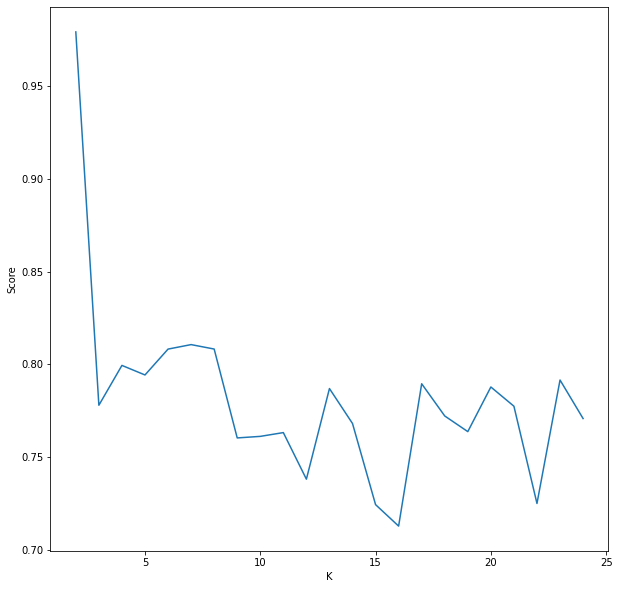

In [ ]:
from IPython.core.pylabtools import figsize
import matplotlib.pyplot as plt
fig, ax = plt.subplots(1, 1, figsize=(10,10))
ax.plot(range(2, 25), silhouette_score)
ax.set_xlabel("K")
ax.set_ylabel("Score")

In [ ]:
output.show()

+-----------+----------------+-----------------------+------------+--------------------+----------+
|   location|excess_mortality|total_cases_per_million|    features|         scaled_feat|prediction|
+-----------+----------------+-----------------------+------------+--------------------+----------+
|Afghanistan|               0|                   1318|[0.0,1318.0]|[0.0,0.0532034020...|         2|
|Afghanistan|               0|                   1320|[0.0,1320.0]|[0.0,0.0532841356...|         2|
|Afghanistan|               0|                   1323|[0.0,1323.0]|[0.0,0.0534052359...|         2|
|Afghanistan|               0|                   1328|[0.0,1328.0]|[0.0,0.0536070697...|         2|
|Afghanistan|               0|                   1330|[0.0,1330.0]|[0.0,0.0536878033...|         2|
|Afghanistan|               0|                   1333|[0.0,1333.0]|[0.0,0.0538089036...|         2|
|Afghanistan|               0|                   1335|[0.0,1335.0]|[0.0,0.0538896371...|         2|


We see that the highest score is achieved if we create 9 clusters, that can cluster our 219 total countries that are included in the dataset. So we can assume that there are 9 different clusters depending on the tests and excess mortality as our features, that can cluster and describe the course of countries through the pandemic between January and February in 2021.


12. Calculate the correlation between vaccination course (if there is a time period under study) and excessive mortality and show the countries with the highest and lowest correlations

In [ ]:
corr_country = []
corr_corr = []

for country in df.select('location').distinct().rdd.map(lambda x : x[0]).collect():
  df_country = df.filter(df.location == country)
  corr = df_country.stat.corr('total_vaccinations', 'excess_mortality')
  corr_country.append(country)
  corr_corr.append(corr)

corr = []
corr_c = []

for i in range(len(corr_corr)):
  if not math.isnan(corr_corr[i]):
    corr.append(corr_corr[i])
    corr_c.append(corr_country[i])

corr, corr_c = zip(*sorted(zip(corr, corr_c)))

print("The 3 countries with the lowest correleation between total vaccinations and excess mortality are : {0} with {1} correlations" .format(corr_c[0:3], corr[0:3]))
print("The 3 countries with the highest correleation between total vaccinations and excess mortality are : {0} with {1} correlations" .format(corr_c[len(corr)-3:], corr[len(corr)-3:]))

The 3 countries with the lowest correleation between total vaccinations and excess mortality are : ('Malaysia', 'Uruguay', 'Denmark') with (-0.7875229251773291, -0.5800781379251314, -0.40319428155344683) correlations
The 3 countries with the highest correleation between total vaccinations and excess mortality are : ('Ukraine', 'Macao', 'Slovakia') with (0.5323938716986365, 0.5716993879982817, 0.7398299211677702) correlations


13. Determine the characteristics of the countries with the highest and lowest exaggerated mortality due to Covid, in terms of the general health of their population (eg smoking, diabetes, heart disease, etc.)

In [ ]:
df_exmort = df.select("location", "date", "excess_mortality_cumulative", "population_density", "aged_65_older", "extreme_poverty", "cardiovasc_death_rate", "diabetes_prevalence", "life_expectancy", "male_smokers", "female_smokers", "hospital_beds_per_thousand")

In [ ]:
df_exmort = df_exmort.filter(df_exmort.excess_mortality_cumulative>0)
df_exmort.sort(df_exmort.excess_mortality_cumulative.desc()).show()

+--------+----------+---------------------------+------------------+-------------+---------------+---------------------+-------------------+---------------+------------+--------------+--------------------------+
|location|      date|excess_mortality_cumulative|population_density|aged_65_older|extreme_poverty|cardiovasc_death_rate|diabetes_prevalence|life_expectancy|male_smokers|female_smokers|hospital_beds_per_thousand|
+--------+----------+---------------------------+------------------+-------------+---------------+---------------------+-------------------+---------------+------------+--------------+--------------------------+
|    Peru|2021-02-28|                         91|                25|            7|              3|                   85|                  5|             76|           0|             4|                         1|
|    Peru|2021-02-21|                         89|                25|            7|              3|                   85|                  5|            

In [ ]:
ex_mort = []
ex_country = []

for country in df_exmort.select('location').distinct().rdd.map(lambda x : x[0]).collect():
  df_country = df_exmort.filter(df_exmort.location == country)
  ex_mort.append(df_country.agg(F.sum("excess_mortality_cumulative")).collect()[0][0]/df_country.count())
  ex_country.append(country)

ex_mort, ex_country = zip(*sorted(zip(ex_mort, ex_country)))
print(ex_mort)
print(ex_country)

(1.0, 1.375, 1.625, 1.7777777777777777, 2.888888888888889, 3.0, 3.5, 3.6666666666666665, 3.7777777777777777, 4.0, 4.444444444444445, 4.5, 5.0, 5.0, 6.0, 6.333333333333333, 7.0, 7.444444444444445, 8.0, 8.5, 8.555555555555555, 8.666666666666666, 8.777777777777779, 9.555555555555555, 10.5, 10.5, 10.666666666666666, 11.0, 11.5, 11.555555555555555, 11.777777777777779, 12.777777777777779, 12.777777777777779, 13.444444444444445, 13.5, 13.666666666666666, 13.777777777777779, 14.0, 14.11111111111111, 14.222222222222221, 14.333333333333334, 14.555555555555555, 14.777777777777779, 15.5, 15.5, 15.88888888888889, 16.0, 16.444444444444443, 16.555555555555557, 17.0, 17.5, 18.0, 18.5, 19.5, 19.5, 20.5, 21.0, 21.0, 22.0, 23.88888888888889, 24.0, 26.88888888888889, 28.5, 28.5, 33.5, 34.0, 36.0, 46.111111111111114, 47.5, 50.55555555555556, 83.88888888888889)
('Iceland', 'Estonia', 'Cyprus', 'Luxembourg', 'Greece', 'Ireland', 'Hong Kong', 'Germany', 'Canada', 'Latvia', 'Malta', 'Macao', 'Gibraltar', 'Tuni

Because in our data excess mortality is different than zero in some days of the month, every week, in our timeline (January-February 2021) we calculate the mean value of it for every country. As we saw above the country with the highest excess mortality is Peru and the country with the lowest excess mortality is Iceland. For those two countries we will see if some characteristics of the population have a relationship with the excess mortality of Covid.

Checkin the population density of Peru and Iceland, the countries with the highest and lowest excess mortality respectively


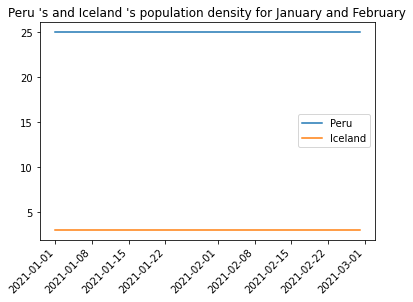

Checkin the extreme poverty of Peru and Iceland, the countries with the highest and lowest excess mortality respectively


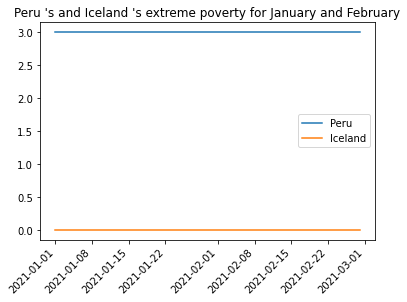

Checkin the number of female smokers of Peru and Iceland, the countries with the highest and lowest excess mortality respectively


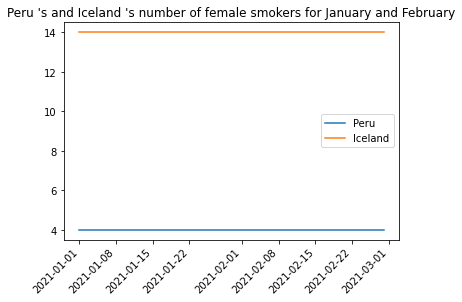

Checkin the number of hospital beds per thousand of Peru and Iceland, the countries with the highest and lowest excess mortality respectively


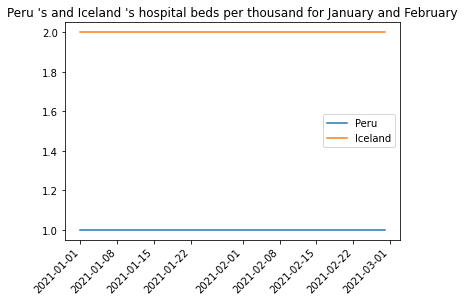

Checkin the number of aged 65 older of Peru and Iceland, the countries with the highest and lowest excess mortality respectively


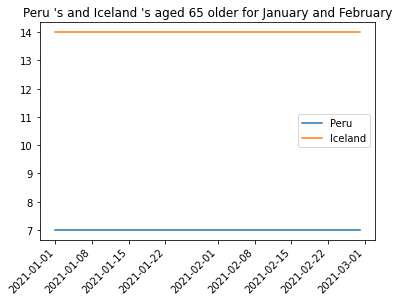

In [ ]:
df_peru = df.filter(df.location == "Peru")
df_iceland = df.filter(df.location == "Iceland")


population_density_peru = df_peru.select('population_density').rdd.map(lambda x : x[0]).collect()
population_density_iceland = df_iceland.select('population_density').rdd.map(lambda x : x[0]).collect()

if (len(population_density_peru) == len(dates)) and (len(population_density_iceland) == len(dates)) :
  print("Checkin the population density of Peru and Iceland, the countries with the highest and lowest excess mortality respectively")
  fig, ax = plt.subplots()
  plt.setp(ax.get_xticklabels(), rotation=45, horizontalalignment='right', fontsize='medium')
  plt.title("{0} 's and {1} 's population density for January and February" .format("Peru", "Iceland"))
  plt.plot(dates, population_density_peru)
  plt.plot(dates, population_density_iceland)
  plt.legend(['Peru', 'Iceland'], loc='best')

plt.show()

extreme_poverty_peru = df_peru.select('extreme_poverty').rdd.map(lambda x : x[0]).collect()
extreme_poverty_iceland = df_iceland.select('extreme_poverty').rdd.map(lambda x : x[0]).collect()

if (len(extreme_poverty_peru) == len(dates)) and (len(extreme_poverty_iceland) == len(dates)) :
  print("Checkin the extreme poverty of Peru and Iceland, the countries with the highest and lowest excess mortality respectively")
  fig, ax = plt.subplots()
  plt.setp(ax.get_xticklabels(), rotation=45, horizontalalignment='right', fontsize='medium')
  plt.title("{0} 's and {1} 's extreme poverty for January and February" .format("Peru", "Iceland"))
  plt.plot(dates, extreme_poverty_peru)
  plt.plot(dates, extreme_poverty_iceland)
  plt.legend(['Peru', 'Iceland'], loc='best')

plt.show()


female_smokers_peru = df_peru.select('female_smokers').rdd.map(lambda x : x[0]).collect()
female_smokers_iceland = df_iceland.select('female_smokers').rdd.map(lambda x : x[0]).collect()

if (len(female_smokers_peru) == len(dates)) and (len(female_smokers_iceland) == len(dates)) :
  print("Checkin the number of female smokers of Peru and Iceland, the countries with the highest and lowest excess mortality respectively")
  fig, ax = plt.subplots()
  plt.setp(ax.get_xticklabels(), rotation=45, horizontalalignment='right', fontsize='medium')
  plt.title("{0} 's and {1} 's number of female smokers for January and February" .format("Peru", "Iceland"))
  plt.plot(dates, female_smokers_peru)
  plt.plot(dates, female_smokers_iceland)
  plt.legend(['Peru', 'Iceland'], loc='best')

plt.show()

hospital_beds_per_thousand_peru = df_peru.select('hospital_beds_per_thousand').rdd.map(lambda x : x[0]).collect()
hospital_beds_per_thousand_iceland = df_iceland.select('hospital_beds_per_thousand').rdd.map(lambda x : x[0]).collect()

if (len(hospital_beds_per_thousand_peru) == len(dates)) and (len(hospital_beds_per_thousand_iceland) == len(dates)) :
  print("Checkin the number of hospital beds per thousand of Peru and Iceland, the countries with the highest and lowest excess mortality respectively")
  fig, ax = plt.subplots()
  plt.setp(ax.get_xticklabels(), rotation=45, horizontalalignment='right', fontsize='medium')
  plt.title("{0} 's and {1} 's hospital beds per thousand for January and February" .format("Peru", "Iceland"))
  plt.plot(dates, hospital_beds_per_thousand_peru)
  plt.plot(dates, hospital_beds_per_thousand_iceland)
  plt.legend(['Peru', 'Iceland'], loc='best')

plt.show()


aged_65_older_peru = df_peru.select('aged_65_older').rdd.map(lambda x : x[0]).collect()
aged_65_older_iceland = df_iceland.select('aged_65_older').rdd.map(lambda x : x[0]).collect()

if (len(aged_65_older_peru) == len(dates)) and (len(aged_65_older_iceland) == len(dates)) :
  print("Checkin the number of aged 65 older of Peru and Iceland, the countries with the highest and lowest excess mortality respectively")
  fig, ax = plt.subplots()
  plt.setp(ax.get_xticklabels(), rotation=45, horizontalalignment='right', fontsize='medium')
  plt.title("{0} 's and {1} 's aged 65 older for January and February" .format("Peru", "Iceland"))
  plt.plot(dates, aged_65_older_peru)
  plt.plot(dates, aged_65_older_iceland)
  plt.legend(['Peru', 'Iceland'], loc='best')

plt.show()

14. 
Examine the spread of the virus in terms of the human development index (human development index) and form clusters of countries with similar characteristics. Briefly analyze the quality characteristics of the clusters you receive.

We firstly check the relationship between total cases and human development index for each day for every country. We see that in most cases human development index is iumutable through time for our period. (Janury - February 2021)

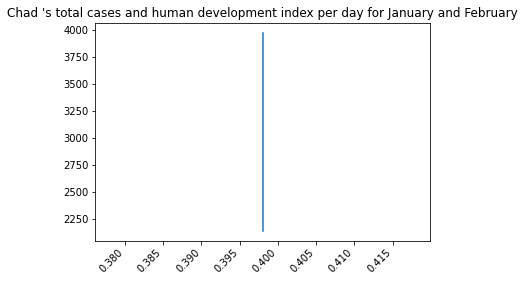

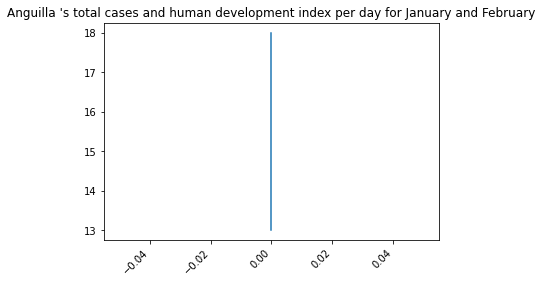

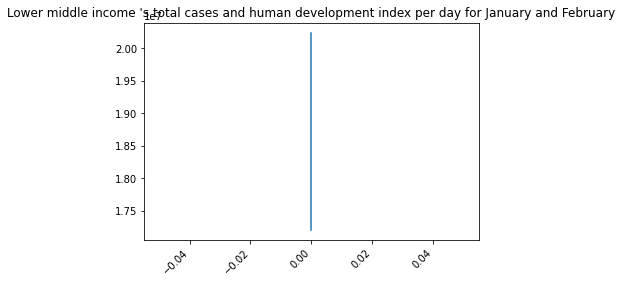

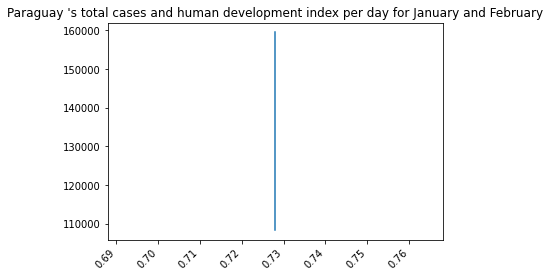

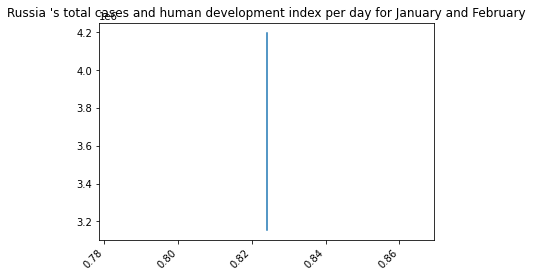

...

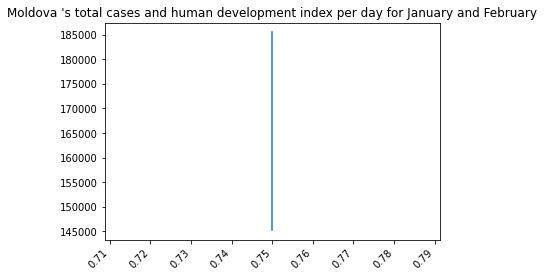

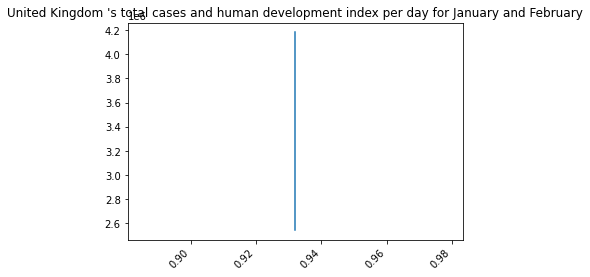

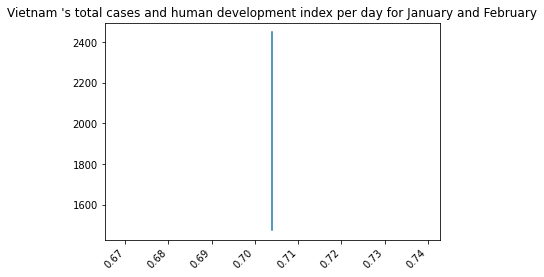

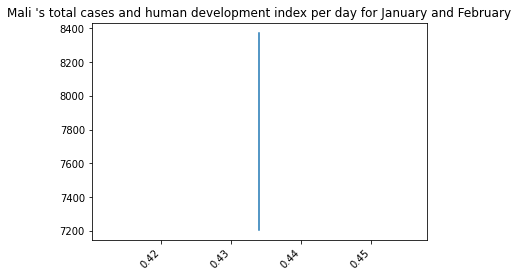

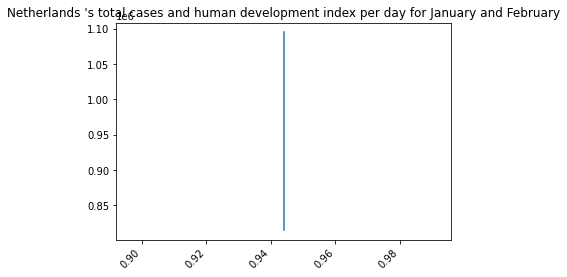

In [ ]:
for country in df.select('location').distinct().rdd.map(lambda x : x[0]).collect():
  df_country = df_init.filter(df.location == country)

  human_development_index = df_country.select('human_development_index').rdd.map(lambda x : x[0]).collect()
  total_cases = df_country.select('total_cases').rdd.map(lambda x : x[0]).collect()
  if len(total_cases) == len(human_development_index):

    fig, ax = plt.subplots()
    plt.setp(ax.get_xticklabels(), rotation=45, horizontalalignment='right', fontsize='medium')
    plt.title("{} 's total cases and human development index per day for January and February" .format(country))
    plt.plot(human_development_index, total_cases)

plt.show()

In [ ]:
df_cl = df_init.select("location", "human_development_index", "total_cases")

#We create the features we are going to use
feat_cols = ["human_development_index", "total_cases"]

In [ ]:
df_cl.show(20)

+-----------+-----------------------+-----------+
|   location|human_development_index|total_cases|
+-----------+-----------------------+-----------+
|Afghanistan|                  0.511|    52513.0|
|Afghanistan|                  0.511|    52586.0|
|Afghanistan|                  0.511|    52709.0|
|Afghanistan|                  0.511|    52909.0|
|Afghanistan|                  0.511|    53011.0|
|Afghanistan|                  0.511|    53105.0|
|Afghanistan|                  0.511|    53207.0|
|Afghanistan|                  0.511|    53332.0|
|Afghanistan|                  0.511|    53400.0|
|Afghanistan|                  0.511|    53489.0|
|Afghanistan|                  0.511|    53538.0|
|Afghanistan|                  0.511|    53584.0|
|Afghanistan|                  0.511|    53690.0|
|Afghanistan|                  0.511|    53775.0|
|Afghanistan|                  0.511|    53831.0|
|Afghanistan|                  0.511|    53938.0|
|Afghanistan|                  0.511|    53984.0|


In [ ]:
vec_assembler = VectorAssembler(inputCols = feat_cols, outputCol='features')

In [ ]:
final_data = vec_assembler.transform(df_cl)
# We scale the data
scaler = StandardScaler(inputCol = 'features', 
                       outputCol = 'scaled_feat',
                       withStd = True,
                       withMean = False)

In [ ]:
scaled_model = scaler.fit(final_data)
cluster_df = scaled_model.transform(final_data)

In [ ]:
cluster_df.show()

+-----------+-----------------------+-----------+---------------+--------------------+
|   location|human_development_index|total_cases|       features|         scaled_feat|
+-----------+-----------------------+-----------+---------------+--------------------+
|Afghanistan|                  0.511|    52513.0|[0.511,52513.0]|[1.76065870219609...|
|Afghanistan|                  0.511|    52586.0|[0.511,52586.0]|[1.76065870219609...|
|Afghanistan|                  0.511|    52709.0|[0.511,52709.0]|[1.76065870219609...|
|Afghanistan|                  0.511|    52909.0|[0.511,52909.0]|[1.76065870219609...|
|Afghanistan|                  0.511|    53011.0|[0.511,53011.0]|[1.76065870219609...|
|Afghanistan|                  0.511|    53105.0|[0.511,53105.0]|[1.76065870219609...|
|Afghanistan|                  0.511|    53207.0|[0.511,53207.0]|[1.76065870219609...|
|Afghanistan|                  0.511|    53332.0|[0.511,53332.0]|[1.76065870219609...|
|Afghanistan|                  0.511|    53

In [ ]:
silhouette_score = []

print(""" 
Silhouette Scores for K means Clustering
========================================
Model\tScore\t
=====\t=====\t
""")

for k in range(2,25):
  kmeans_algo = KMeans(featuresCol='scaled_feat',k=k)
  kmeans_fit = kmeans_algo.fit(cluster_df)
  output = kmeans_fit.transform(cluster_df)
  score = eval.evaluate(output)
  silhouette_score.append(score)
  print(f"K{k}\t{score}\t")

 
Silhouette Scores for K means Clustering
Model	Score	
=====	=====	

K2	0.8055579731840508	
K3	0.8782597118361308	
K4	0.7222261949238606	
K5	0.7828660417128874	
K6	0.7961989575622882	
K7	0.8123829190182793	
K8	0.7235317361024008	
K9	0.7328404157505187	
K10	0.686896363874415	
K11	0.658526598752248	
K12	0.7373715653287553	
K13	0.6756246508398649	
K14	0.7185383860201073	
K15	0.689917777984948	
K16	0.7346005933553427	
K17	0.6501708447785736	
K18	0.6680761013864478	
K19	0.6461124931147088	
K20	0.7335443636844684	
K21	0.6736939290286408	
K22	0.6862335186636579	
K23	0.6836622516012927	
K24	0.6802451749783396	


Text(0, 0.5, 'Score')

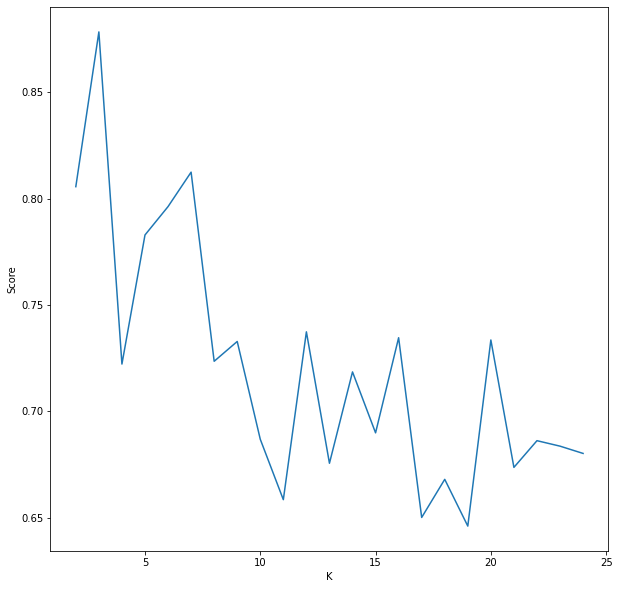

In [ ]:
fig, ax = plt.subplots(1, 1, figsize=(10,10))
ax.plot(range(2, 25), silhouette_score)
ax.set_xlabel("K")
ax.set_ylabel("Score")

We see that for k = 3 clusters we have the highest score

In [ ]:
k=3
kmeans_algo = KMeans(featuresCol='scaled_feat',k=k)
kmeans_fit = kmeans_algo.fit(cluster_df)
output = kmeans_fit.transform(cluster_df)
score = eval.evaluate(output)
silhouette_score.append(score)
print(f"K{k}\t{score}\t")

K3	0.8782597118361308	


The centers of the clusters we create

In [ ]:
centers = kmeans_fit.clusterCenters()
print(centers)

[array([0.       , 0.2678509]), array([2.48964876, 0.06550788]), array([1.26967266, 9.1797933 ])]


In [ ]:
output.show()

+-----------+-----------------------+-----------+---------------+--------------------+----------+
|   location|human_development_index|total_cases|       features|         scaled_feat|prediction|
+-----------+-----------------------+-----------+---------------+--------------------+----------+
|Afghanistan|                  0.511|    52513.0|[0.511,52513.0]|[1.76065870219609...|         1|
|Afghanistan|                  0.511|    52586.0|[0.511,52586.0]|[1.76065870219609...|         1|
|Afghanistan|                  0.511|    52709.0|[0.511,52709.0]|[1.76065870219609...|         1|
|Afghanistan|                  0.511|    52909.0|[0.511,52909.0]|[1.76065870219609...|         1|
|Afghanistan|                  0.511|    53011.0|[0.511,53011.0]|[1.76065870219609...|         1|
|Afghanistan|                  0.511|    53105.0|[0.511,53105.0]|[1.76065870219609...|         1|
|Afghanistan|                  0.511|    53207.0|[0.511,53207.0]|[1.76065870219609...|         1|
|Afghanistan|       